# Multi-Class Prediction of Obesity Risk

data: https://www.kaggle.com/competitions/playground-series-s4e2

* Traore Amadou
* Amiche Ines
* Michel Doroch
* Pierre Derathe
* Nazim kazar
* Nesrine Lagraa

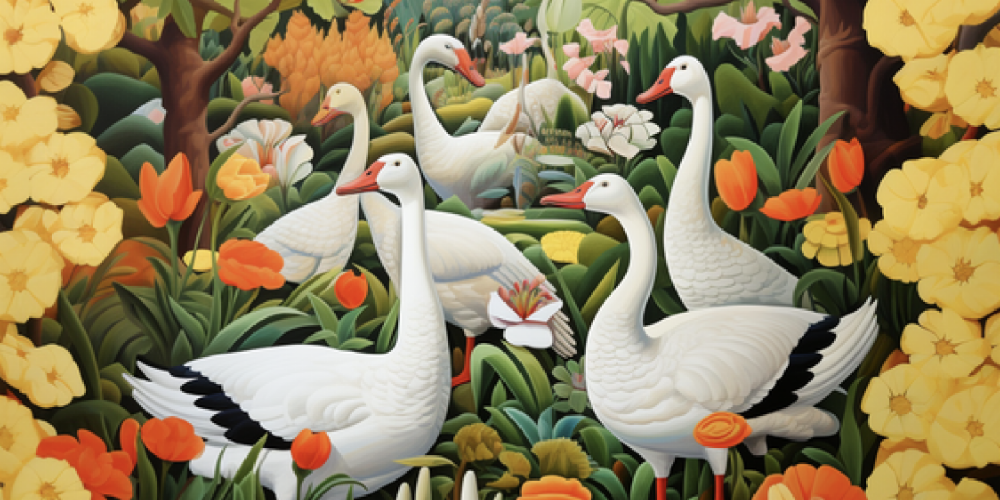

## Basic information about the data and the competition

* Multi-class classification problem 
* Target: 7 classes
* Scoring: accuracy score
* Synthetically-Generated Datasets
* Train set shape: 20758 x 17 (at the beginning)
* Test set shape: 13840 x 17 (at the beginning)
* February 1, 2024 - February 29, 2024

In [463]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/playground-series-s4e2/sample_submission.csv
/kaggle/input/playground-series-s4e2/train.csv
/kaggle/input/playground-series-s4e2/test.csv


In [464]:
# !pip install catboost

## imports

In [2]:
import numpy as np # linear algebra
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import pandas as pd
import warnings
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier as RFC
from sklearn.metrics import roc_auc_score, accuracy_score


from catboost import CatBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix

warnings.filterwarnings("ignore")
pd

<module 'pandas' from '/opt/conda/lib/python3.10/site-packages/pandas/__init__.py'>

In [466]:
import os
os.path.join('/kaggle/input/playground-series-s4e2/')

'/kaggle/input/playground-series-s4e2/'

In [467]:
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

/kaggle/input/playground-series-s4e2/sample_submission.csv
/kaggle/input/playground-series-s4e2/train.csv
/kaggle/input/playground-series-s4e2/test.csv


In [5]:
train_data = pd.read_csv('/kaggle/input/playground-series-s4e2/train.csv')
test_data = pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')

train_data, test_data = train_data.drop(columns = ['id']), test_data.drop(columns = ['id'])

top 5 columns:

In [7]:
train_data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


## Categorical features pie charts

In [469]:
train_data
categ_columns = ['Gender', 'family_history_with_overweight', 'FAVC', 'CAEC', 'SMOKE', 'SCC', 'CALC', 'MTRANS']
target = 'NObeyesdad'

In [470]:
def pie_chart_plot(feature):
#     title_is_train = 'train data'
#     df = train_data
    
#     if not train_mode:
#         df = test_data
#         title_is_train = 'test data'
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(16, 8))
    
    df_train = pd.DataFrame(train_data[feature].value_counts().reset_index())
    
    
    explode_lst_train = [0.1 for _ in range(df_train.shape[0])]
    
#     plt.figure(figsize = (15, 6))
    axes[0].pie(data=df_train, x='count', labels = feature, autopct='%1.0f%%', explode=explode_lst_train, startangle=90)
    axes[0].set_title(f'{feature} train_data')
    
    if feature != target:
        df_test = pd.DataFrame(test_data[feature].value_counts().reset_index())
        explode_lst_test = [0.1 for _ in range(df_test.shape[0])]
        axes[1].pie(data=df_test, x='count', labels = feature, autopct='%1.0f%%', explode=explode_lst_test, startangle=90)
        axes[1].set_title(f'{feature} test_data')
#     plt.legend()
    plt.show()

In [471]:
train_data.head()

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad
0,Male,24.443011,1.699998,81.669950,yes,yes,2.000000,2.983297,Sometimes,no,2.763573,no,0.000000,0.976473,Sometimes,Public_Transportation,Overweight_Level_II
1,Female,18.000000,1.560000,57.000000,yes,yes,2.000000,3.000000,Frequently,no,2.000000,no,1.000000,1.000000,no,Automobile,Normal_Weight
2,Female,18.000000,1.711460,50.165754,yes,yes,1.880534,1.411685,Sometimes,no,1.910378,no,0.866045,1.673584,no,Public_Transportation,Insufficient_Weight
3,Female,20.952737,1.710730,131.274851,yes,yes,3.000000,3.000000,Sometimes,no,1.674061,no,1.467863,0.780199,Sometimes,Public_Transportation,Obesity_Type_III
4,Male,31.641081,1.914186,93.798055,yes,yes,2.679664,1.971472,Sometimes,no,1.979848,no,1.967973,0.931721,Sometimes,Public_Transportation,Overweight_Level_II


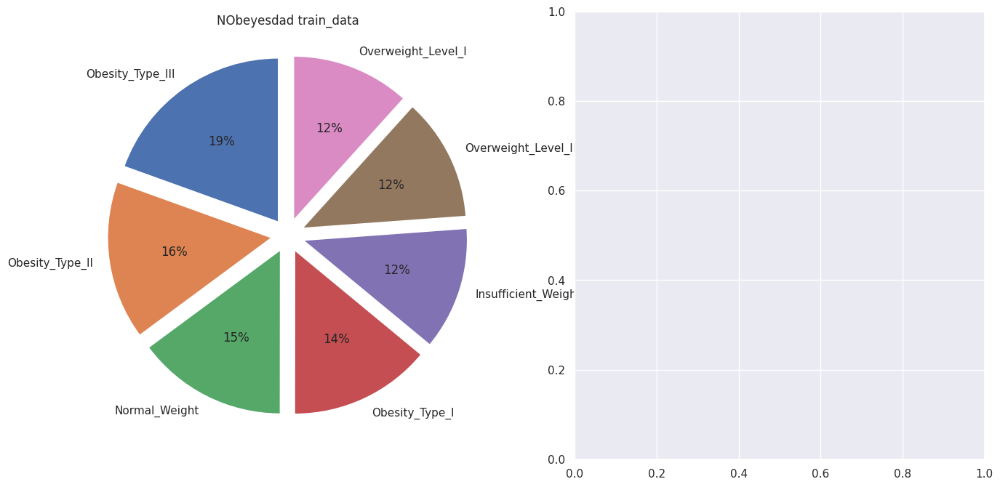

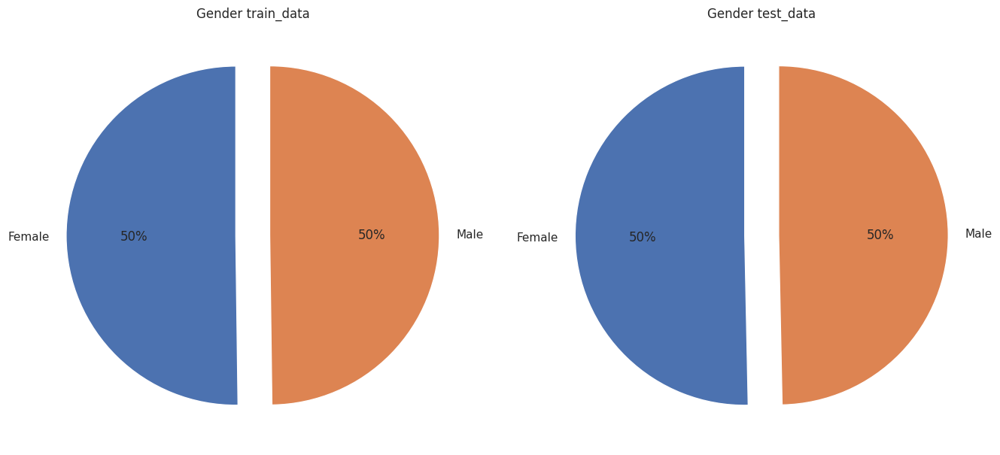

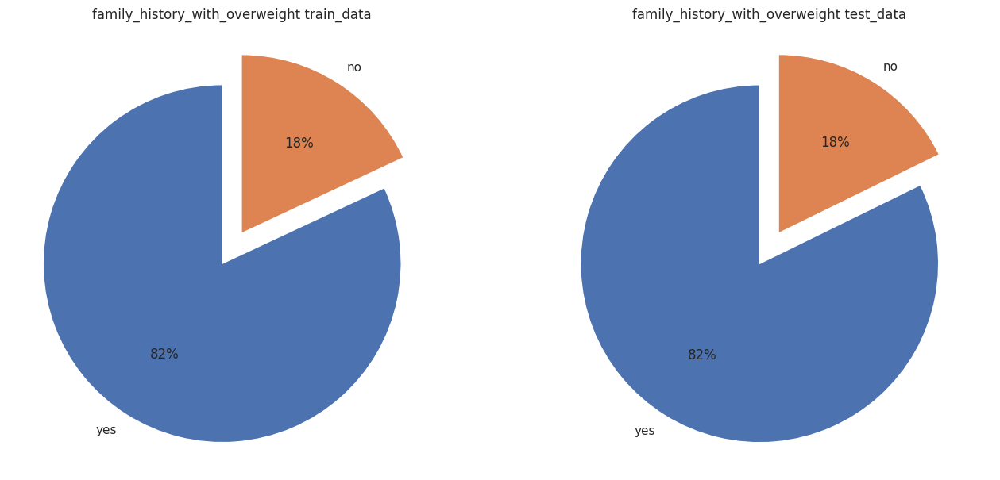

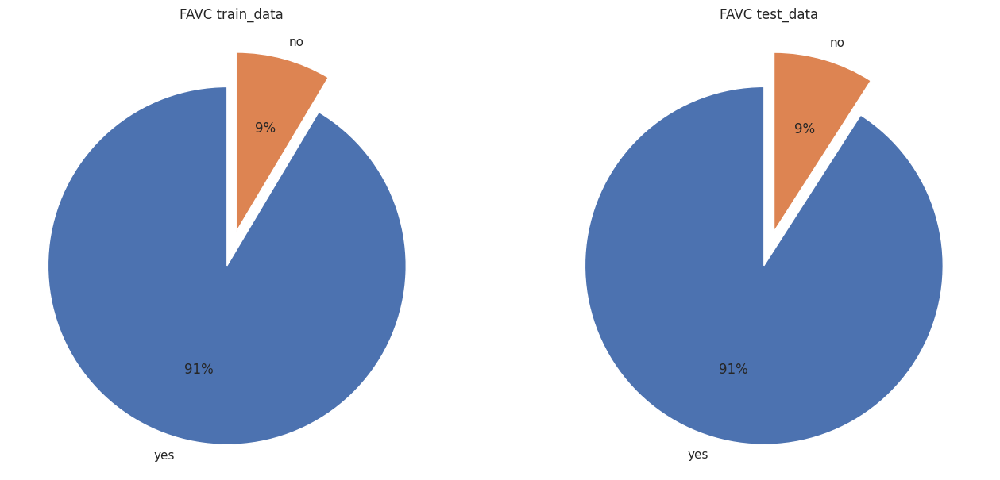

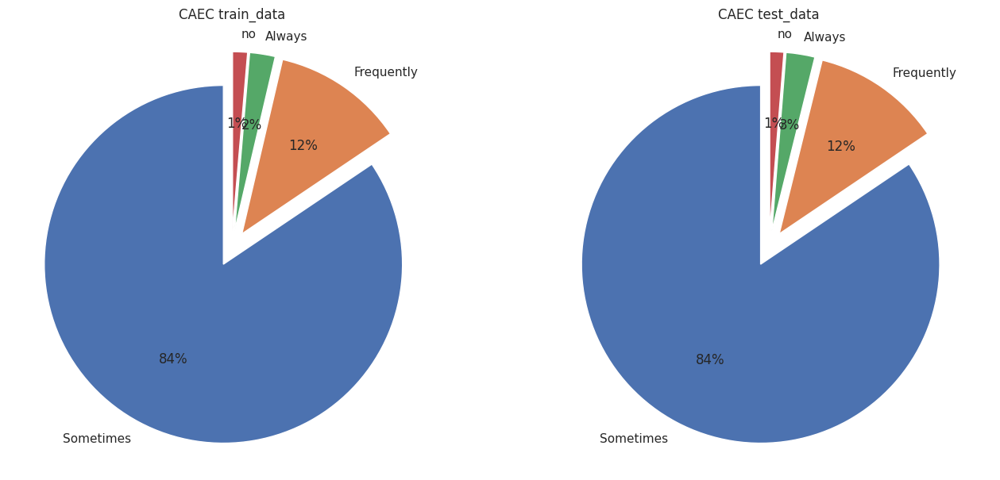

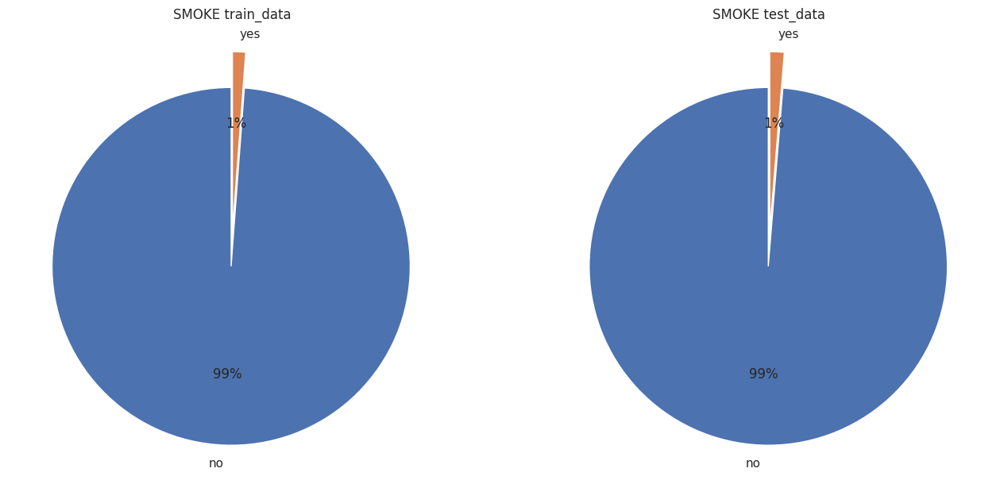

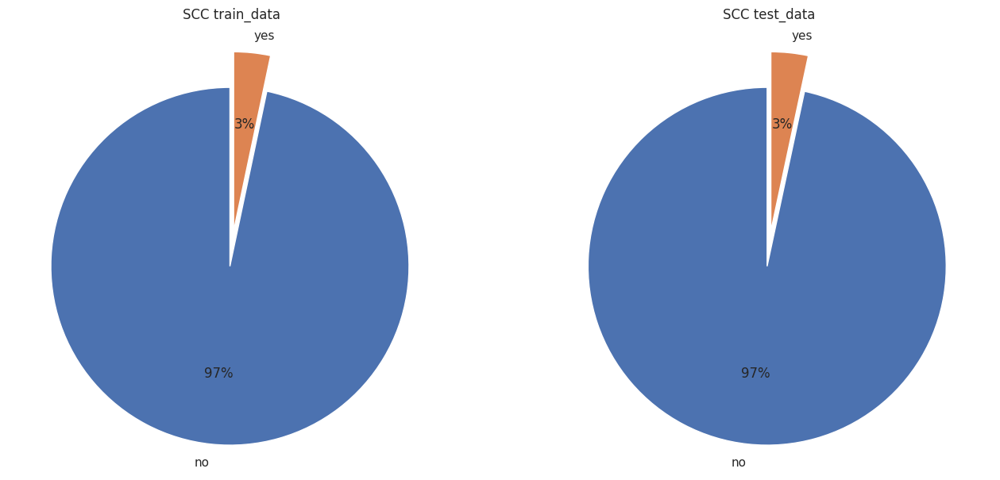

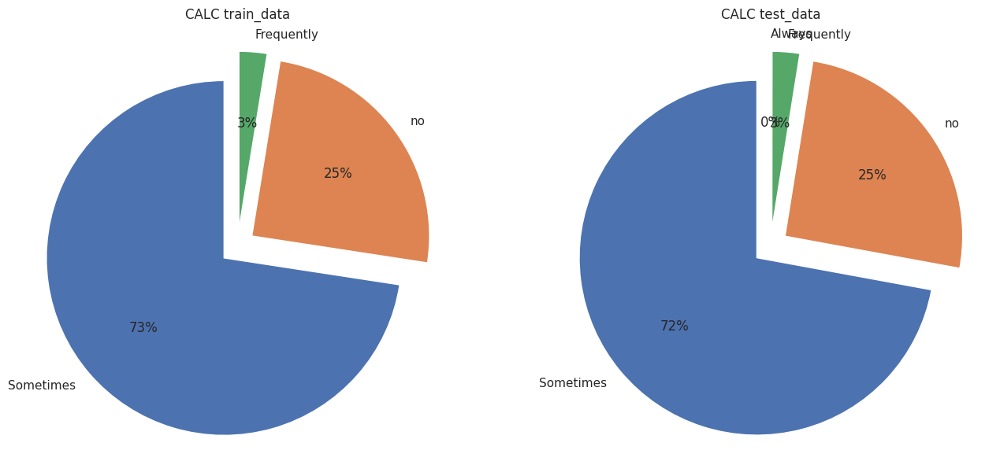

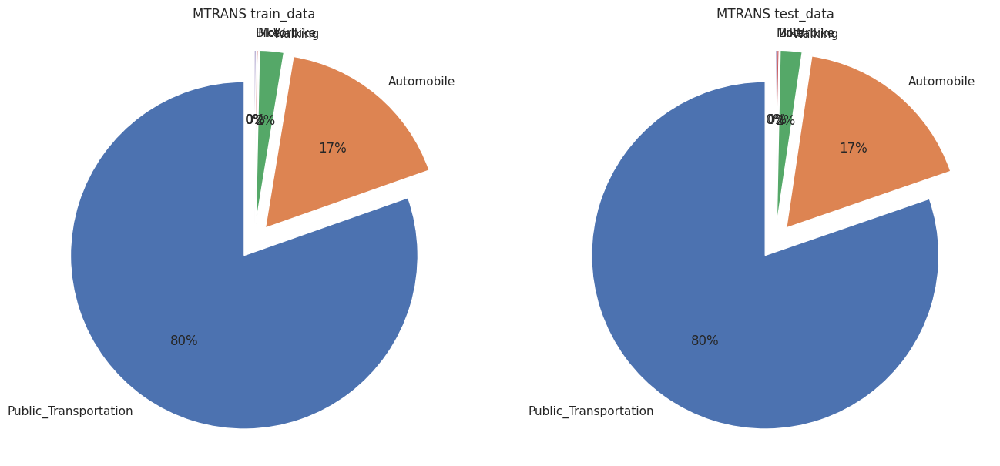

In [472]:
for col in ['NObeyesdad'] + categ_columns:
    pie_chart_plot(col)

The target variable (classes) is distributed almost equally. The largest proportion of objects belong to the class Obesity_Type_III (19%)

##  Different values 

In [473]:
train_data[train_data['CALC'] == 'Always']

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS,NObeyesdad


In [474]:
test_data[test_data['CALC'] == 'Always']

,Gender,Age,Height,Weight,family_history_with_overweight,FAVC,FCVC,NCP,CAEC,SMOKE,CH2O,SCC,FAF,TUE,CALC,MTRANS
4023,Female,20.0,1.66,60.0,yes,yes,3.0,3.0,Always,no,2.0,no,0.0,0.0,Always,Public_Transportation
7443,Male,21.0,1.67,66.5,no,yes,2.0,3.0,Frequently,no,2.0,no,1.0,0.0,Always,Public_Transportation


test set contains new value ‘Always’

## Hist plots

Let's plot a target distribution depending on categorical features

In [475]:
def show_hist_plot(feature):
    sns.set(rc={'figure.figsize':(12,6)})
    sns.histplot(binwidth=0.5, x='NObeyesdad', hue=feature,
                 data=train_data, stat="count", multiple="stack")
    plt.title(f'target vs {feature}')
    plt.xticks(rotation=45)
    plt.show()

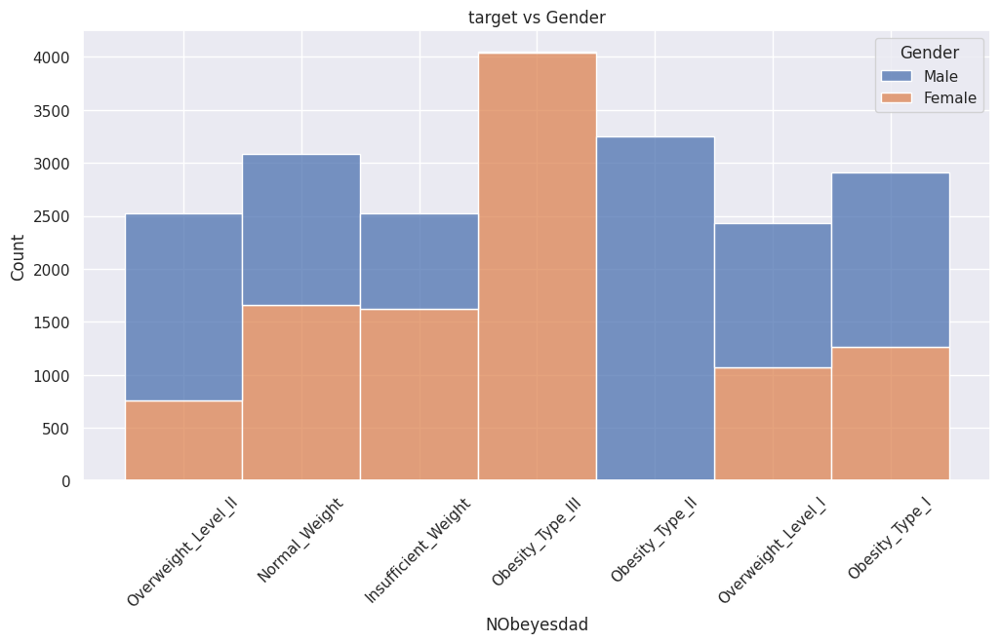

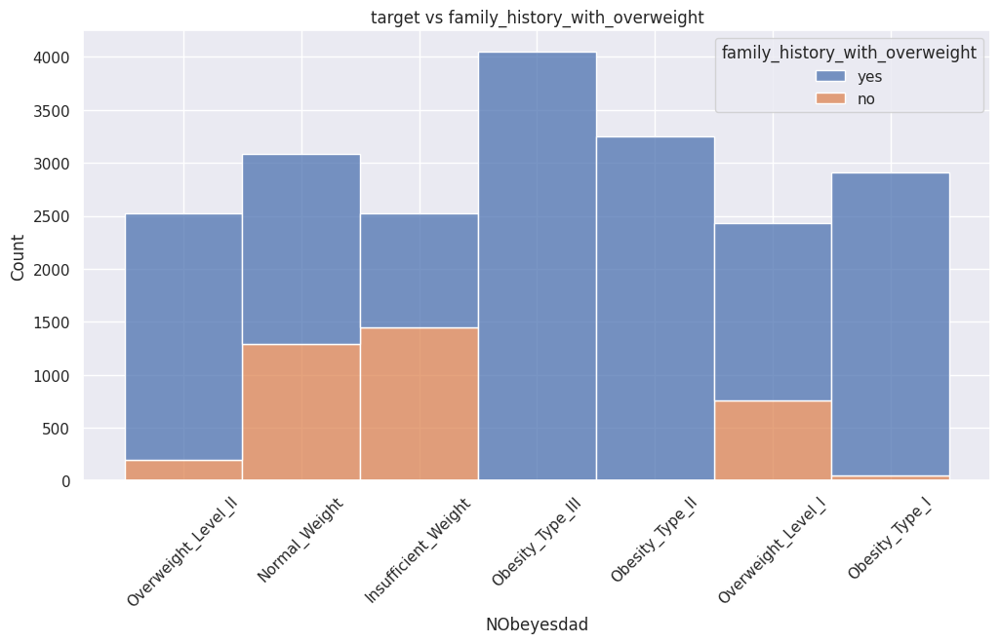

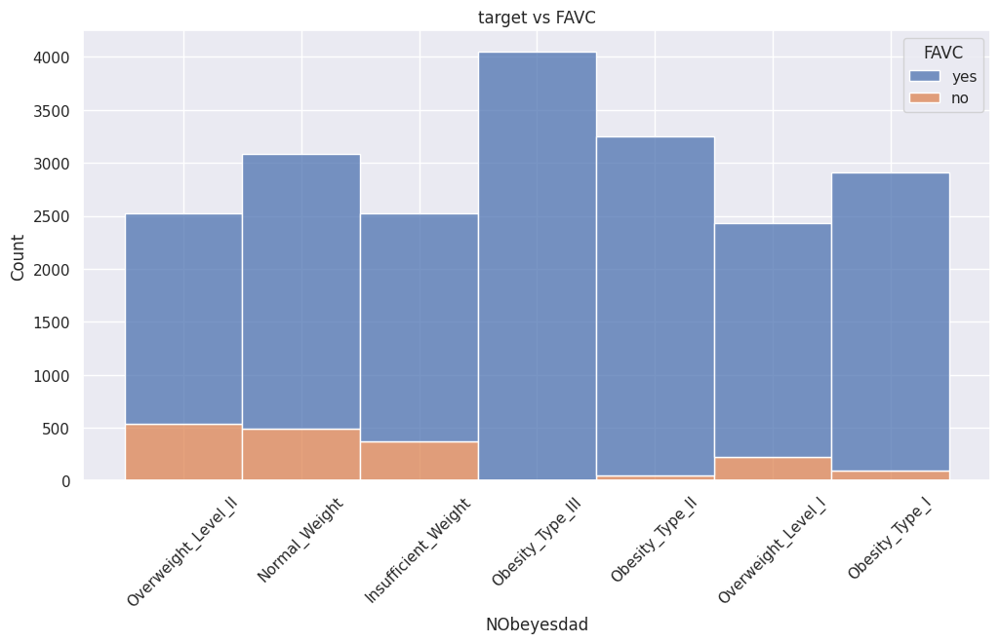

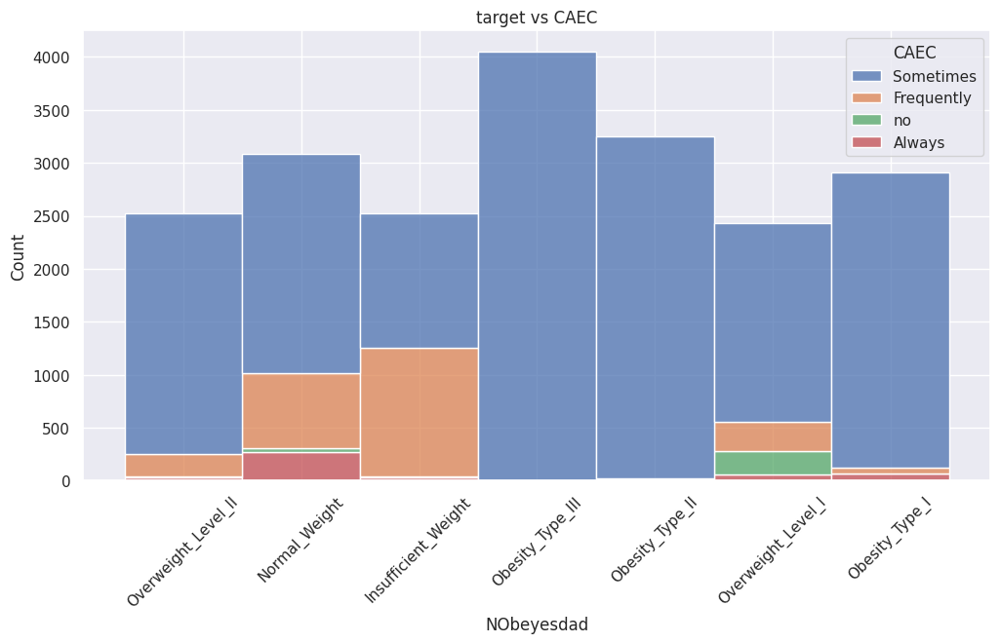

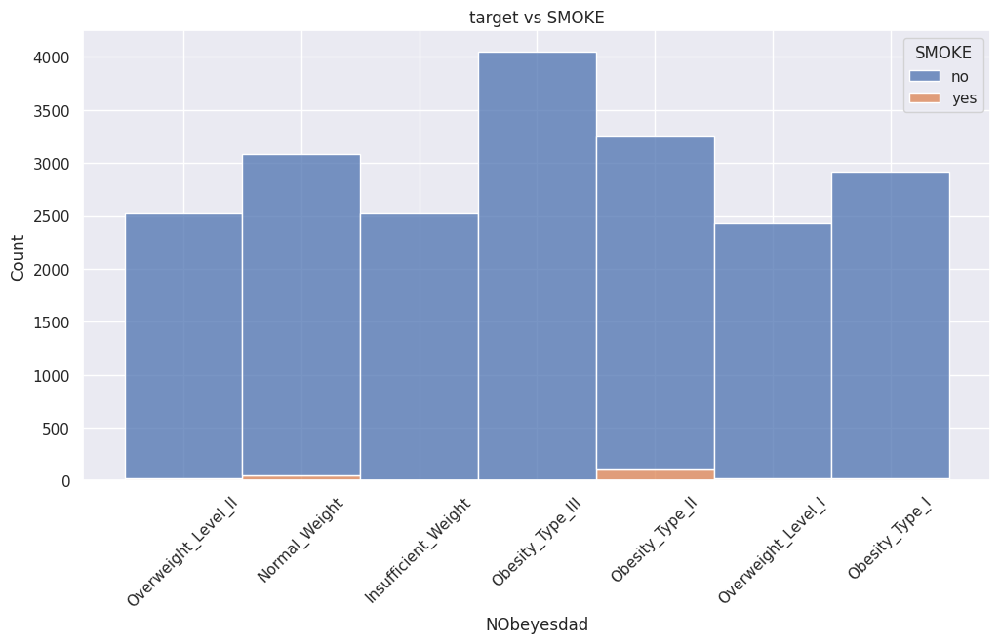

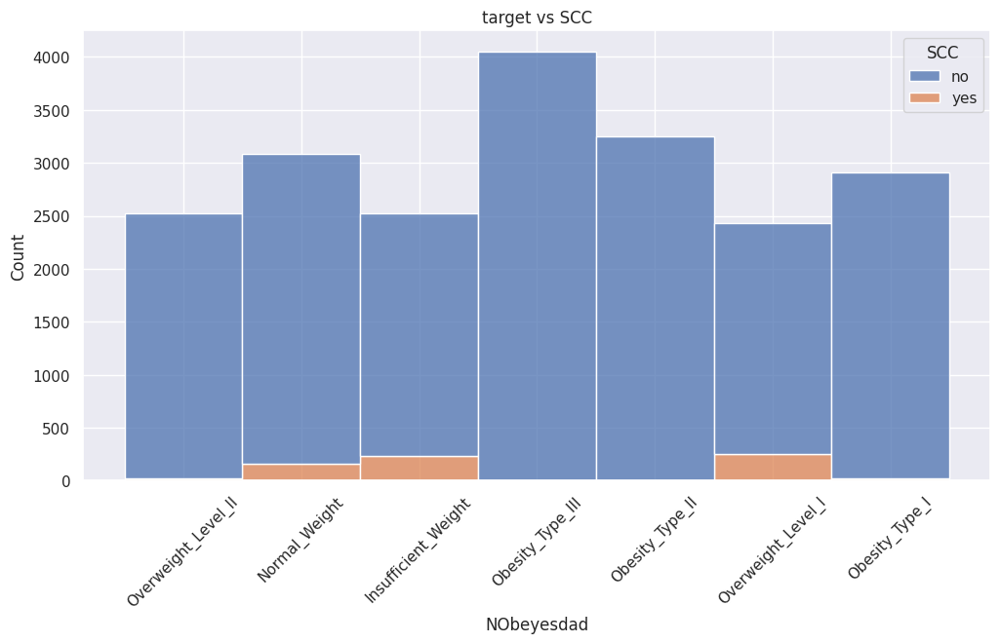

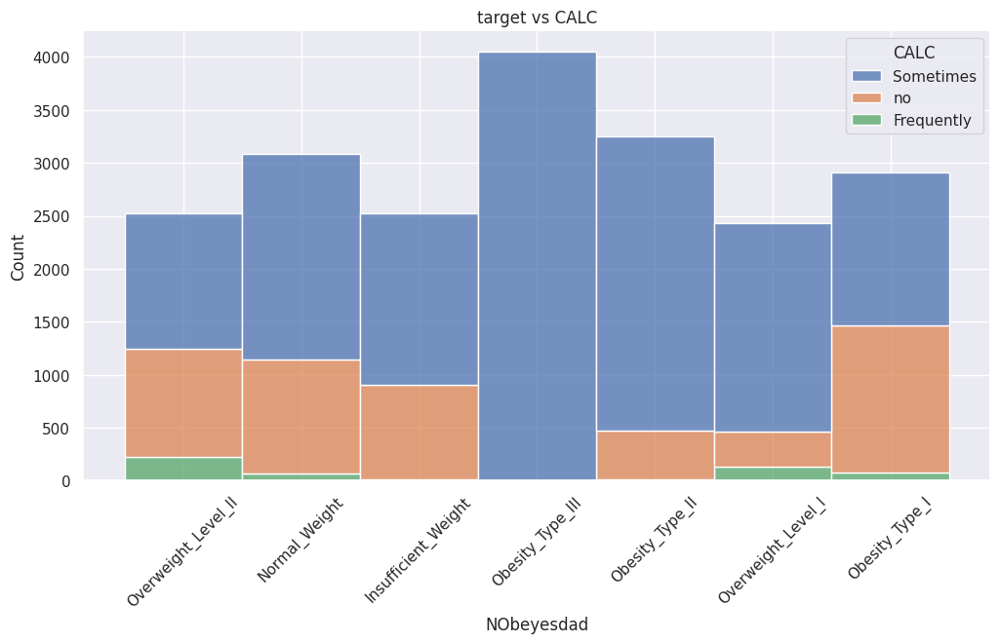

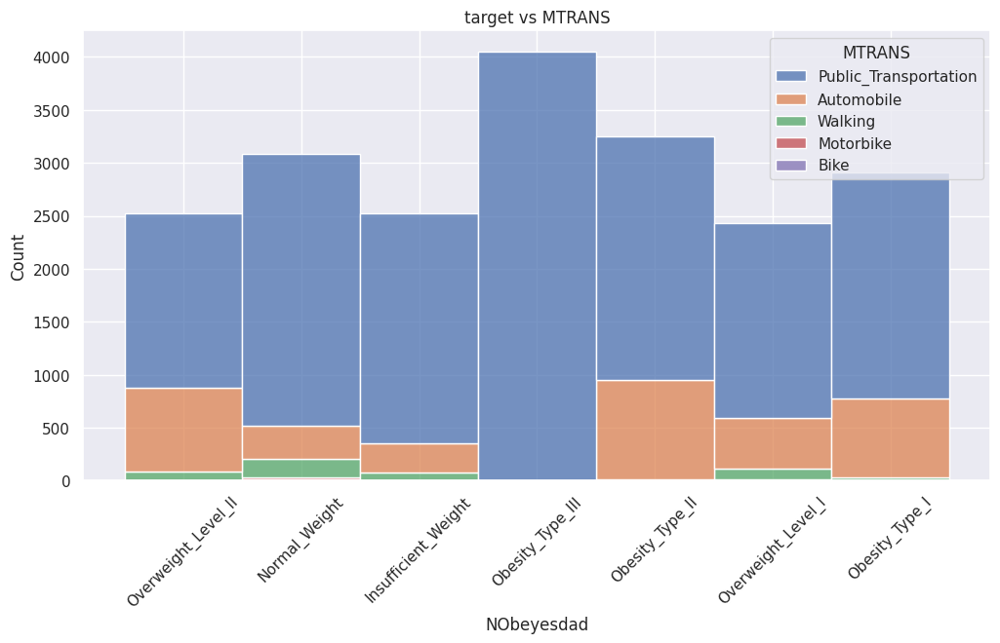

In [476]:
for col in categ_columns:
    show_hist_plot(col)

ideas:

1) remove smoke, probably SCC: Feature values contain imbalance, possible outliers

2) Heuristic: obesiry_type_3 == (public transport) == (calc sometimes) == Female

## Numerical features analysis

Let's plot distributions of numerical features depending on the target, age

In [477]:
train_data
num_columns = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'TUE', 'FAF', 'CH2O']

<Figure size 800x640 with 0 Axes>

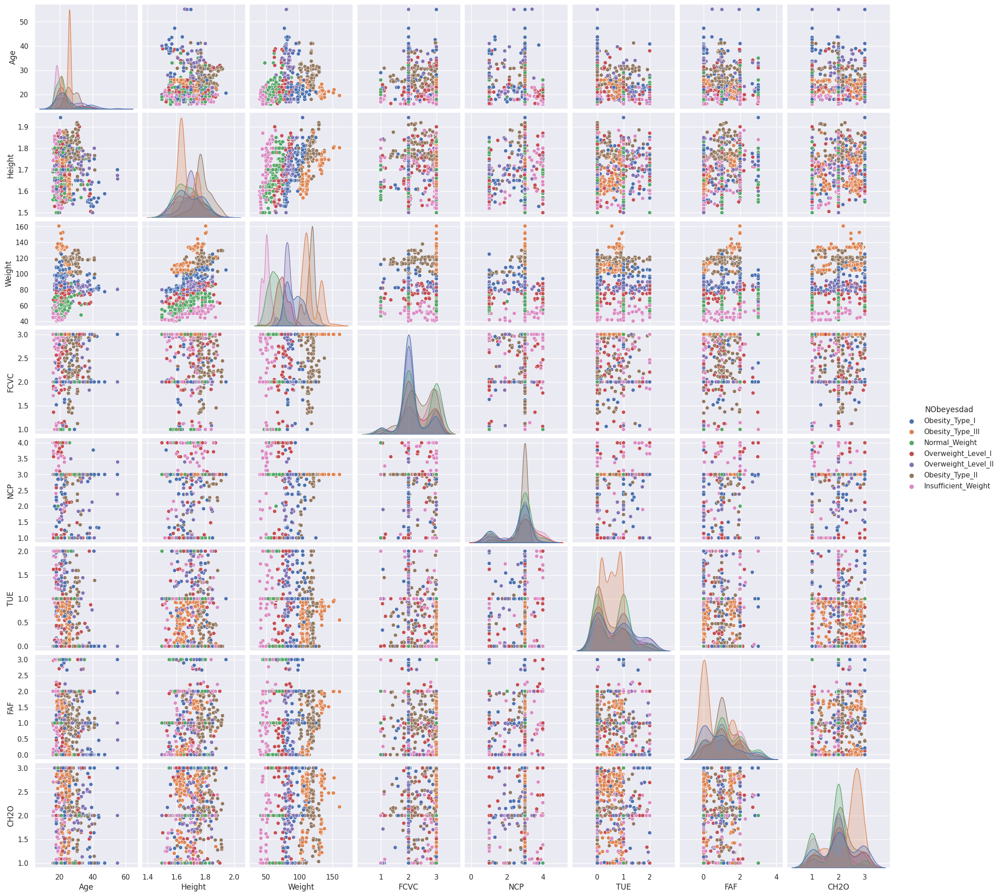

In [480]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(train_data[num_columns + ['NObeyesdad']].sample(1000), kind="scatter", hue='NObeyesdad')
plt.show()

## Pair plot by gender

In [481]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS'],
      dtype='object')

<Figure size 800x640 with 0 Axes>

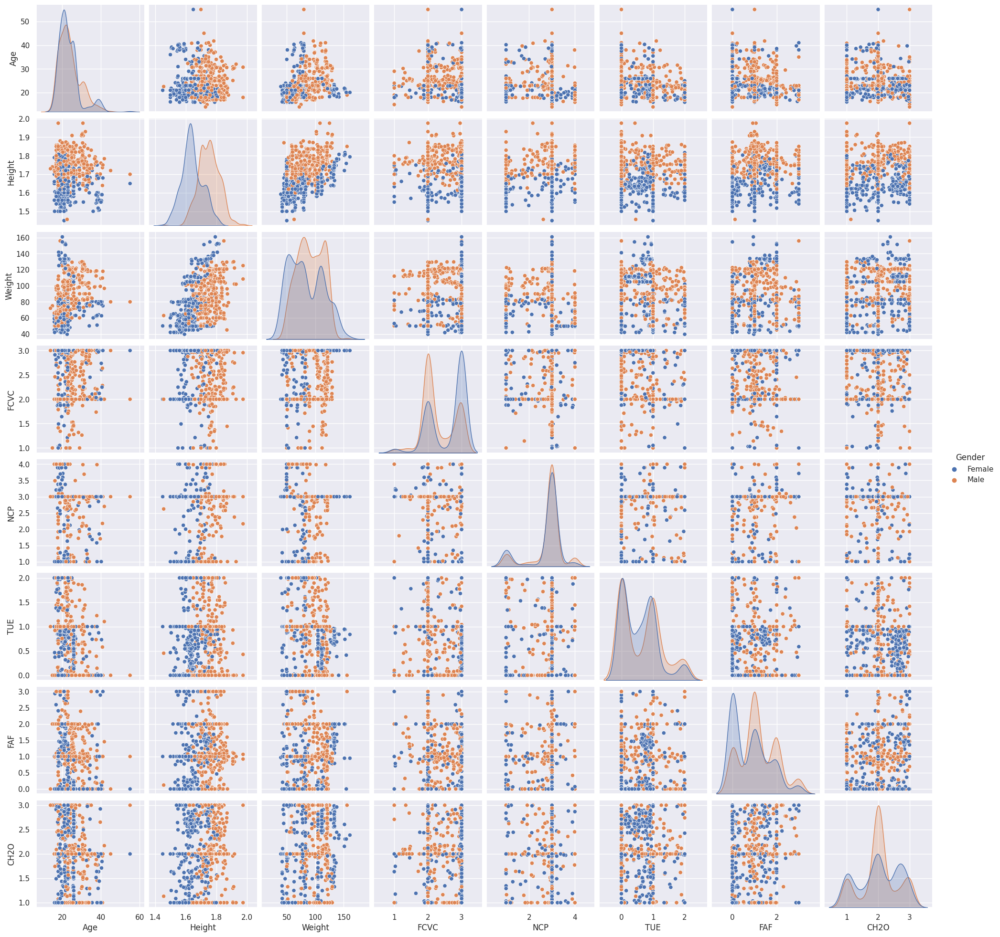

In [482]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(train_data[num_columns + ['Gender']].sample(1000), kind="scatter", hue='Gender')
plt.show()

idea: train models separately for each gender

## pair plot by obesity +/-

<Figure size 800x640 with 0 Axes>

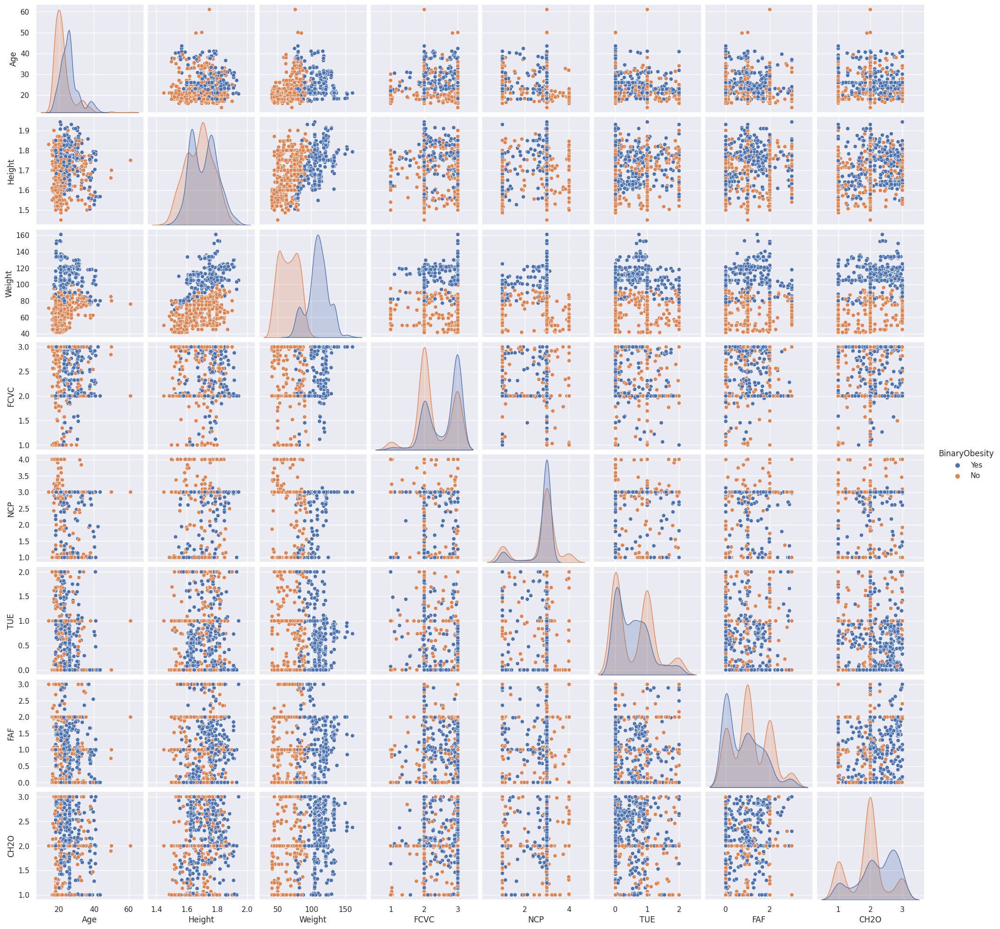

In [483]:
train_data['BinaryObesity'] = np.where(train_data['NObeyesdad'].str.startswith('Obesity'), 'Yes', 'No')

plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(train_data[num_columns + ['BinaryObesity']].sample(1000), kind="scatter", hue='BinaryObesity')
plt.show()



In [484]:
train_data['BinaryObesity'].value_counts()

BinaryObesity
No     10554
Yes    10204
Name: count, dtype: int64

In [485]:
del train_data['BinaryObesity']

## Check covariate shift

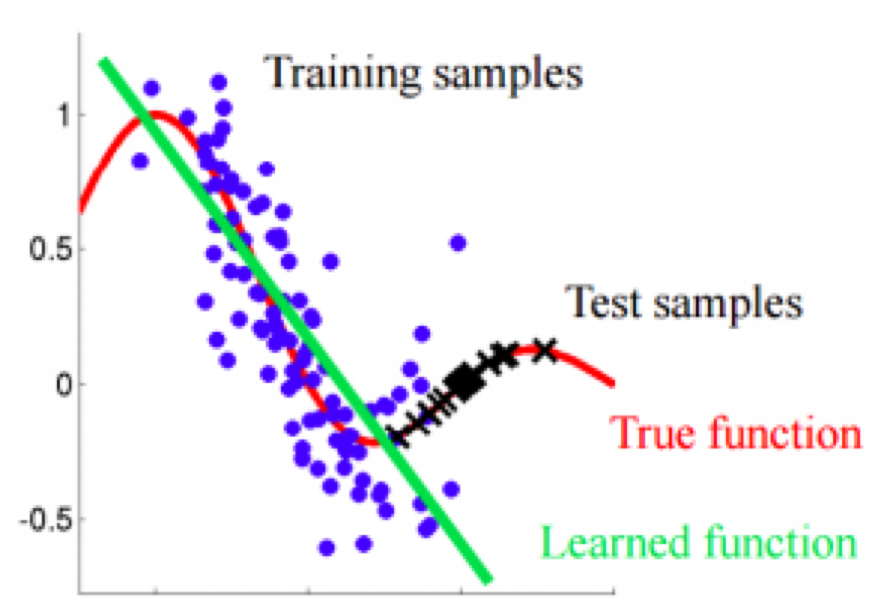

In [486]:
def encode_multilabel_features(data):
    data["CAEC"] = data["CAEC"].map({"no": 0, "Sometimes": 1, "Frequently": 2, "Always": 3}).astype(np.uint8)
    data['SCC']  = np.where(data["SCC"] == "no", 1,0).astype(np.uint8)
    data["CALC"] = data["CALC"].map({"no": 0, "Sometimes": 1, "Frequently": 2, "Always": 2}).astype(np.uint8)
    data['MTRANS'] = data['MTRANS'].map({"Bike":4, "Motorbike":3, "Walking":2, "Automobile":1, "Public_Transportation":0}).astype(np.uint8)
    return data
train_data = encode_multilabel_features(train_data)
test_data = encode_multilabel_features(test_data)

In [487]:
train_data_copy = train_data.copy()
test_data_copy = test_data.copy()

train_data_copy['is_train'] = 1
test_data_copy['is_train'] = 0

data_copy = pd.concat([train_data_copy.drop(columns = ['NObeyesdad']), test_data_copy])
data_copy.shape, train_data_copy.shape

((34598, 17), (20758, 18))

In [488]:
categ_columns

['Gender',
 'family_history_with_overweight',
 'FAVC',
 'CAEC',
 'SMOKE',
 'SCC',
 'CALC',
 'MTRANS']

In [489]:
train_data['MTRANS'].unique()

array([0, 1, 2, 3, 4], dtype=uint8)

In [490]:
from sklearn.preprocessing import LabelEncoder
def encode_bin_cols(data):
    for column in ['Gender', 'family_history_with_overweight', 'FAVC', 'SMOKE', 'SCC']:
        label_encoder = LabelEncoder()
        data[f'{column}'] = label_encoder.fit_transform(data[column])
    return data
data_copy = encode_bin_cols(data_copy)

In [492]:
X_train, X_test, y_train, y_test = train_test_split(data_copy.drop(columns = ['is_train']), data_copy['is_train'], test_size=0.2, shuffle=True)


In [493]:

rfc = RFC()
rfc.fit(X_train, y_train)
y_pred_proba = rfc.predict_proba(X_test)[:, 1]
roc_auc_score(y_test, y_pred_proba), accuracy_score(y_test, rfc.predict(X_test))

(0.5035144948056288, 0.5635838150289018)

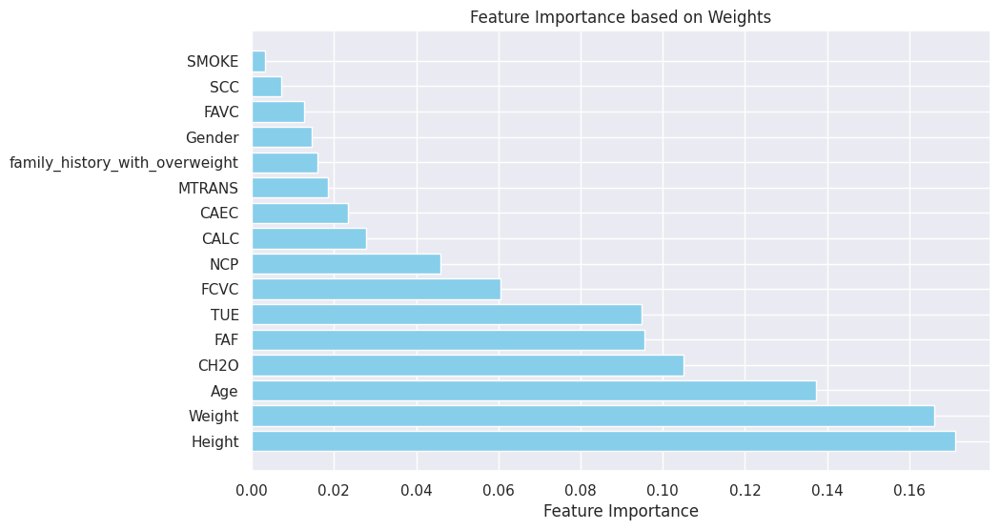

[('Height', 0.17119439205666484),
 ('Weight', 0.16605365877491354),
 ('Age', 0.13738154923373108),
 ('CH2O', 0.10501640961446514),
 ('FAF', 0.09563372117894278),
 ('TUE', 0.09489631750193243),
 ('FCVC', 0.060417116351493626),
 ('NCP', 0.04583164097184794),
 ('CALC', 0.027845891846040378),
 ('CAEC', 0.023370683579370485),
 ('MTRANS', 0.018483543940272965),
 ('family_history_with_overweight', 0.016055499677497833),
 ('Gender', 0.01460296862077426),
 ('FAVC', 0.012828048128721004),
 ('SCC', 0.0071745782524358995),
 ('SMOKE', 0.0032139802708958274)]

In [494]:
def plot_importance(model, columns):
    lst = [(i, j) for i, j in zip(columns, model.feature_importances_)]
    sorted_lst = sorted(lst, key=lambda x: x[1], reverse=True)

    feature_names, feature_importance = zip(*sorted_lst)

# Create a bar plot
    plt.figure(figsize=(10, 6))
    plt.barh(feature_names, feature_importance, color='skyblue')
    plt.xlabel('Feature Importance')
    plt.title('Feature Importance based on Weights')
    plt.show()
    return sorted_lst

plot_importance(rfc, X_train.columns)

In [495]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS'],
      dtype='object')

We cannot conclude that there are differences in distributions because the model cannot separate the train set from the test set (classification metric == 0.5)

## Reducing dim + clustering

In [496]:
!pip uninstall umap 
!pip install umap-learn

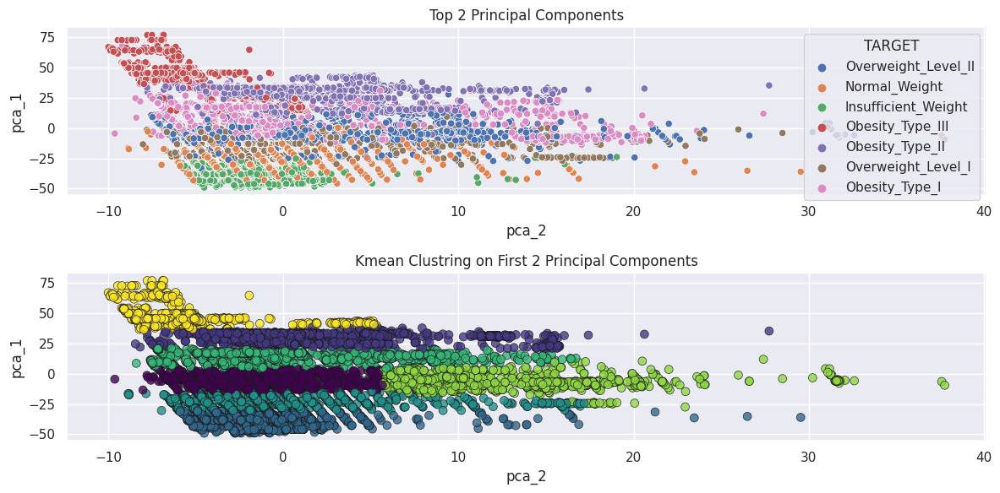

In [497]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap.umap_ as umap
from sklearn.cluster import KMeans
RANDOM_SEED = 239

#PCA
train = train_data
raw_num_cols = ['Age', 'Height', 'Weight', 'FCVC', 'NCP', 'TUE', 'FAF', 'CH2O']
# raw_num_cols = train_data.columns
TARGET = 'NObeyesdad'

# pca = umap.UMAP(random_state=42, n_components=2)
pca = PCA(random_state=42, n_components=2)
pca_top_2 = pca.fit_transform(train[raw_num_cols])

tmp = pd.DataFrame(data = pca_top_2, columns = ['pca_1','pca_2'])
tmp['TARGET'] = train[TARGET]

fig,axs = plt.subplots(2,1,figsize = (12,6))
sns.scatterplot(data=tmp, y="pca_1", x="pca_2", hue='TARGET',ax=axs[0])
axs[0].set_title("Top 2 Principal Components")

#KMeans
kmeans = KMeans(7,random_state=RANDOM_SEED)
kmeans.fit(tmp[['pca_1','pca_2']])
sns.scatterplot( y= tmp['pca_1'],x = tmp['pca_2'],c = kmeans.labels_,cmap='viridis', marker='o', edgecolor='k', s=50, alpha=0.8,ax = axs[1])
axs[1].set_title("Kmean Clustring on First 2 Principal Components")
plt.tight_layout()
plt.show()

In [498]:
pca = PCA(n_components=len(train[raw_num_cols].columns))
pca.fit(train[raw_num_cols])

# Access the explained variance ratio
variance_ratio = pca.explained_variance_ratio_

# Print the variance ratio for each principal component
print("Variance Ratio for Each Principal Component:")
for i, ratio in enumerate(variance_ratio):
    print(f"Principal Component {i + 1}: {ratio:.4f}")

Variance Ratio for Each Principal Component:
Principal Component 1: 0.9565
Principal Component 2: 0.0407
Principal Component 3: 0.0010
Principal Component 4: 0.0007
Principal Component 5: 0.0005
Principal Component 6: 0.0004
Principal Component 7: 0.0003
Principal Component 8: 0.0000


In [499]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS'],
      dtype='object')

It was possible to cluster the points above and below well, but in the middle all the points are mixed.

Idea: outliers detection

## Feature engineering

* Created about 5 features based on body mass index
* Сreated about 10 features based on the remaining features

In [501]:
def round_cols(df = train_data):
    for col in ['FCVC',"NCP","CH2O","FAF","TUE"]:
        df[col] = round(df[col])
        df[col] = df[col].astype('int')
    return df
train_data = round_cols()

In [502]:
train_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'NObeyesdad'],
      dtype='object')

In [504]:
train_data = encode_bin_cols(train_data)
test_data = encode_bin_cols(test_data)

In [505]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS'],
      dtype='object')

Adding some features based on BMI index: 

$BMI = \frac{Weight}{Height^2}$

$index\_breightman = \frac{Weight}{Height*100*0.7 - 50}$

$index\_noorden = \frac{Weight}{Height*100*0.42}$

etc..

Table from Wiki:

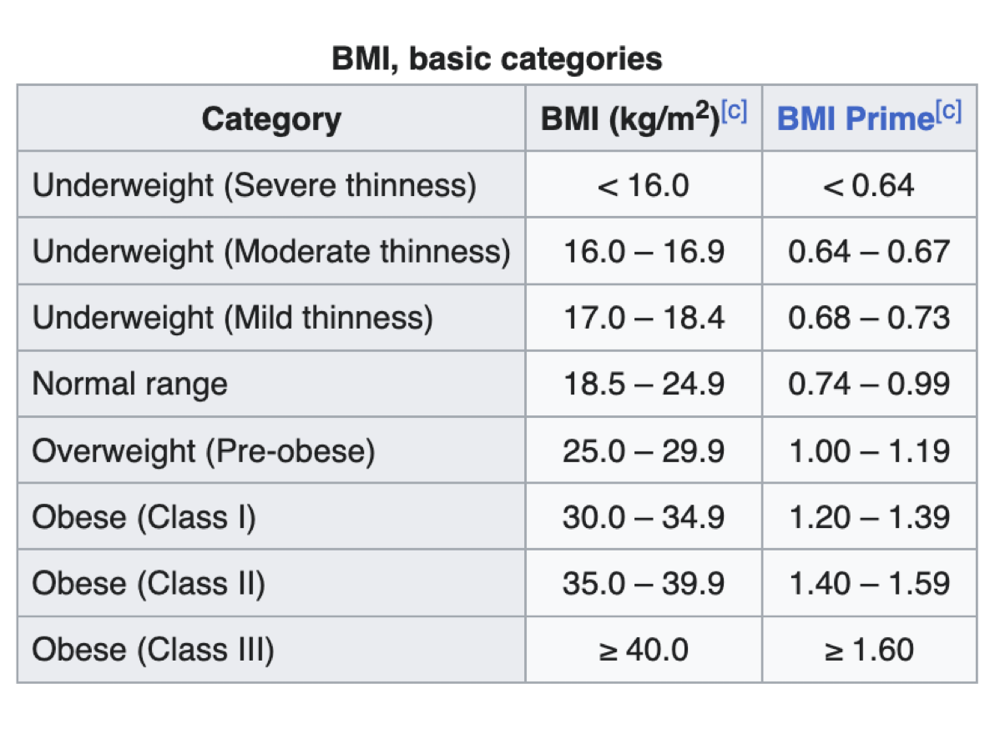

In [ ]:
def add_indexes_features(df = train_data):

    df['index_breightman'] = df['Weight'] / (df['Height']*100*0.7 - 50)

    df['index_noorden'] = df['Weight'] / (df['Height']*100*0.42)

    df['index_taton'] = df['Weight'] / \
                    (df['Height']*100 - (100 + (df['Height'] - 100) / 20))

    df['index_ponderal'] = 10 * ((df['Weight']**(1/3)) / df['Height'])
    
    df["BMI"]     = df["Weight"] / df["Height"]**2;
    
    
    
    df["BMI_Grp"] = \
    np.select([df["BMI"] < 18.5, df["BMI"] < 25, df["BMI"] < 30, df["BMI"] < 35, df["BMI"] < 40],
              [0,1,2,3,4], 5
             ).astype(np.int8);

    df["BMIbyNCP"]  = np.log1p(df["BMI"]) - np.log1p(df["NCP"]);
    df["BMIFAF"]    = (df["BMI"] * df["FAF"])/ 25.0;
    df["FAFmTUE"]   = df["FAF"] - df["TUE"];
    df["FCVCpNCP"]  = df['FCVC'] * df['NCP'];
    df['TechUse']   = np.log1p(df['TUE']) - np.log1p(df['Age']);
    
    df['Activity'] = df['FAF'] / df['TUE']
    # Age group
    df['Age_Group'] = pd.cut(df['Age'], bins=[0, 18, 30, 45, float('inf')], labels=[0, 1, 2, 3])
    df['Age_Group'] = df['Age_Group'].astype(int)
    # Height group
    df['Height_Group'] = pd.cut(df['Height'], bins=[0, 1.5, 1.6, 1.7, 1.8, 1.9, 2.0, float('inf')], labels=[0, 1, 2, 3, 4, 5, 6])
    df['Height_Group'] = df['Height_Group'].astype(int)
    #Risk score
    df['Risk factor'] = (df['BMI'] + df['Age_Group']) * (df["family_history_with_overweight"] + df["SMOKE"])
    
    return df

train_data = add_indexes_features(df = train_data)
test_data = add_indexes_features(df = test_data)

target encode function

In [507]:
def target_encode(data):
    data['NObeyesdad'] = data['NObeyesdad'].map({'Insufficient_Weight':0, 'Normal_Weight': 1, 'Overweight_Level_I':2, 'Overweight_Level_II':3,
                                                 'Obesity_Type_I':4, 'Obesity_Type_II':5, 'Obesity_Type_III': 6}).astype(np.uint8)
    return data
train_data = target_encode(train_data)

In [509]:
test_data.columns

Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
       'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
       'CALC', 'MTRANS', 'index_breightman', 'index_noorden', 'index_taton',
       'index_ponderal', 'BMI', 'BMI_Grp', 'BMIbyNCP', 'BMIFAF', 'FAFmTUE',
       'FCVCpNCP', 'TechUse', 'Activity', 'Age_Group', 'Height_Group',
       'Risk factor'],
      dtype='object')

## Feature selection

remove features using rfe

In [510]:
from sklearn.feature_selection import CO
from sklearn.ensemble import RandomForestClassifier

# Specify the estimator (e.g., RandomForestClassifier)
estimator = RandomForestClassifier()

# Set the number of features to select
n_features = 5

# RFE with RandomForestClassifier as the estimator
selector = RFE(estimator)

# Fit and transform the data
X_selected = selector.fit_transform(train_data.drop(columns = ['NObeyesdad']), train_data['NObeyesdad'])

In [511]:
selected_columns = train_data.drop(columns = ['NObeyesdad']).columns[selector.support_]

print("Selected Columns:", selected_columns)

Selected Columns: Index(['Gender', 'Age', 'Height', 'Weight', 'index_breightman',
       'index_noorden', 'index_taton', 'index_ponderal', 'BMI', 'BMI_Grp',
       'BMIbyNCP', 'BMIFAF', 'FCVCpNCP', 'TechUse', 'Risk factor'],
      dtype='object')


## Correlation

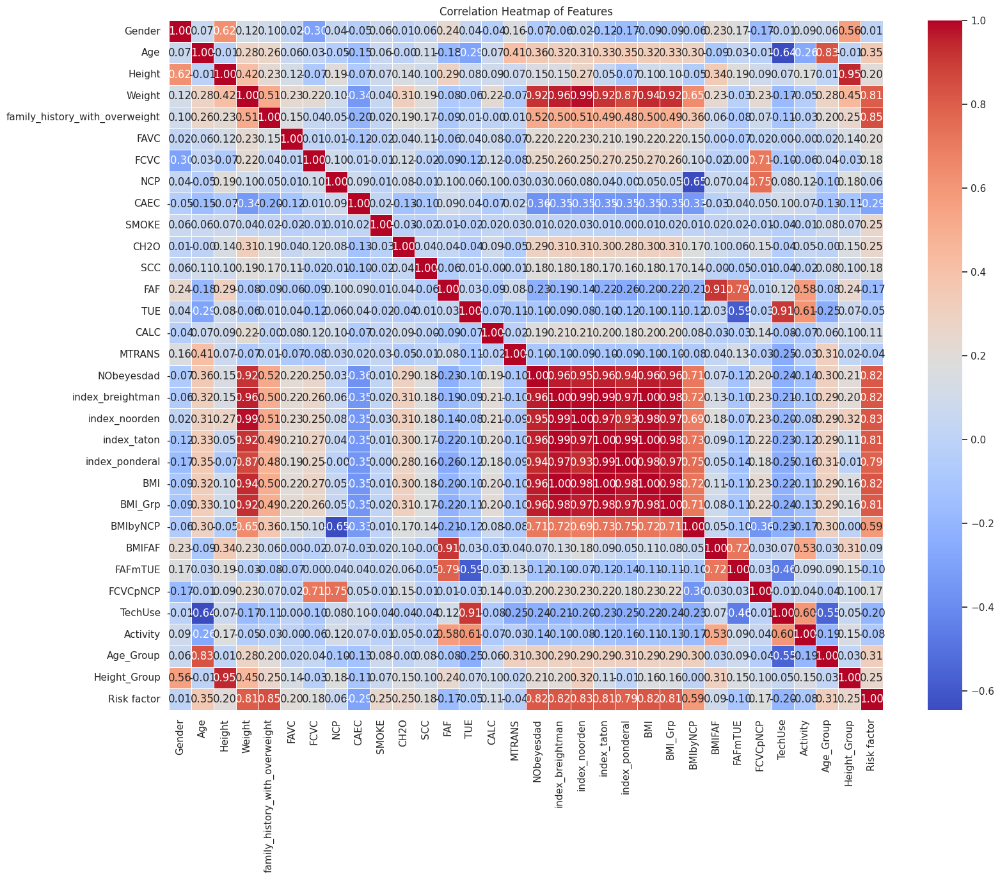

In [512]:
correlation_matrix = train_data.corr()

# Create a heatmap using seaborn
plt.figure(figsize=(18, 14))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap of Features')
plt.show()


multicollinearity 

probably: drop index features 

## Predict binary obesity 

In [513]:
train_data['is_NObeyesdad'] = np.where(train_data['NObeyesdad'] > 3, 1, 0)


In [514]:
params = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
    }


rfc = CatBoostClassifier(**params)

In [515]:
X_train, X_test, y_train, y_test = train_test_split(train_data.drop(columns = ['is_NObeyesdad', 'NObeyesdad']), train_data['is_NObeyesdad'], test_size=0.2, shuffle=True)

rfc.fit(X_train, y_train)
y_pred_proba = rfc.predict_proba(X_test)[:, 1]
roc_auc_score(y_test, y_pred_proba), accuracy_score(y_test, rfc.predict(X_test))

Learning rate set to 0.015522
0:	learn: 0.6591233	total: 42.4ms	remaining: 1m 24s
1000:	learn: 0.0578078	total: 36.5s	remaining: 36.4s
1999:	learn: 0.0484554	total: 1m 13s	remaining: 0us


(0.997427127884352, 0.975674373795761)

We can separate 1 class from 0 very well

# Variance Ratio for Each Principal Component

In [516]:
train_data['NObeyesdad'].unique()

array([3, 1, 0, 6, 5, 2, 4], dtype=uint8)

In [522]:
# !pip install catboost-gpu

pca = PCA(n_components=len(train_data.columns))
pca.fit(train_data)

# Access the explained variance ratio
variance_ratio = pca.explained_variance_ratio_

# Print the variance ratio for each principal component
print("Variance Ratio for Each Principal Component:")
for i, ratio in enumerate(variance_ratio):
    print(f"Principal Component {i + 1}: {ratio:.4f}")

Variance Ratio for Each Principal Component:
Principal Component 1: 0.8891
Principal Component 2: 0.0637
Principal Component 3: 0.0267
Principal Component 4: 0.0087
Principal Component 5: 0.0058
Principal Component 6: 0.0023
Principal Component 7: 0.0013
Principal Component 8: 0.0004
Principal Component 9: 0.0004
Principal Component 10: 0.0003
Principal Component 11: 0.0002
Principal Component 12: 0.0002
Principal Component 13: 0.0002
Principal Component 14: 0.0002
Principal Component 15: 0.0001
Principal Component 16: 0.0001
Principal Component 17: 0.0001
Principal Component 18: 0.0001
Principal Component 19: 0.0001
Principal Component 20: 0.0000
Principal Component 21: 0.0000
Principal Component 22: 0.0000
Principal Component 23: 0.0000
Principal Component 24: 0.0000
Principal Component 25: 0.0000
Principal Component 26: 0.0000
Principal Component 27: 0.0000
Principal Component 28: 0.0000
Principal Component 29: 0.0000
Principal Component 30: 0.0000
Principal Component 31: 0.0000
Pri

In [523]:
train_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20758 entries, 0 to 20757
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          20758 non-null  int64  
 1   Age                             20758 non-null  float64
 2   Height                          20758 non-null  float64
 3   Weight                          20758 non-null  float64
 4   family_history_with_overweight  20758 non-null  int64  
 5   FAVC                            20758 non-null  int64  
 6   FCVC                            20758 non-null  int64  
 7   NCP                             20758 non-null  int64  
 8   CAEC                            20758 non-null  uint8  
 9   SMOKE                           20758 non-null  int64  
 10  CH2O                            20758 non-null  int64  
 11  SCC                             20758 non-null  int64  
 12  FAF                             

In [525]:
# !pip install ordinalgbt

# Outliers

In [526]:
train_data.columns, start_cols

(Index(['Gender', 'Age', 'Height', 'Weight', 'family_history_with_overweight',
        'FAVC', 'FCVC', 'NCP', 'CAEC', 'SMOKE', 'CH2O', 'SCC', 'FAF', 'TUE',
        'CALC', 'MTRANS', 'NObeyesdad', 'index_breightman', 'index_noorden',
        'index_taton', 'index_ponderal', 'BMI', 'BMI_Grp', 'BMIbyNCP', 'BMIFAF',
        'FAFmTUE', 'FCVCpNCP', 'TechUse', 'Activity', 'Age_Group',
        'Height_Group', 'Risk factor', 'is_NObeyesdad'],
       dtype='object'),
 ['Gender',
  'Age',
  'Height',
  'Weight',
  'family_history_with_overweight',
  'FAVC',
  'FCVC',
  'NCP',
  'CAEC',
  'SMOKE',
  'CH2O',
  'SCC',
  'FAF',
  'TUE',
  'CALC',
  'MTRANS'])

In [527]:
list(train_data['NObeyesdad'].drop_duplicates())

[3, 1, 0, 6, 5, 2, 4]

In [528]:
train_data_before_drop = train_data.copy()

IsolationForest for each class separetely. drop 10%

<Figure size 480x480 with 0 Axes>

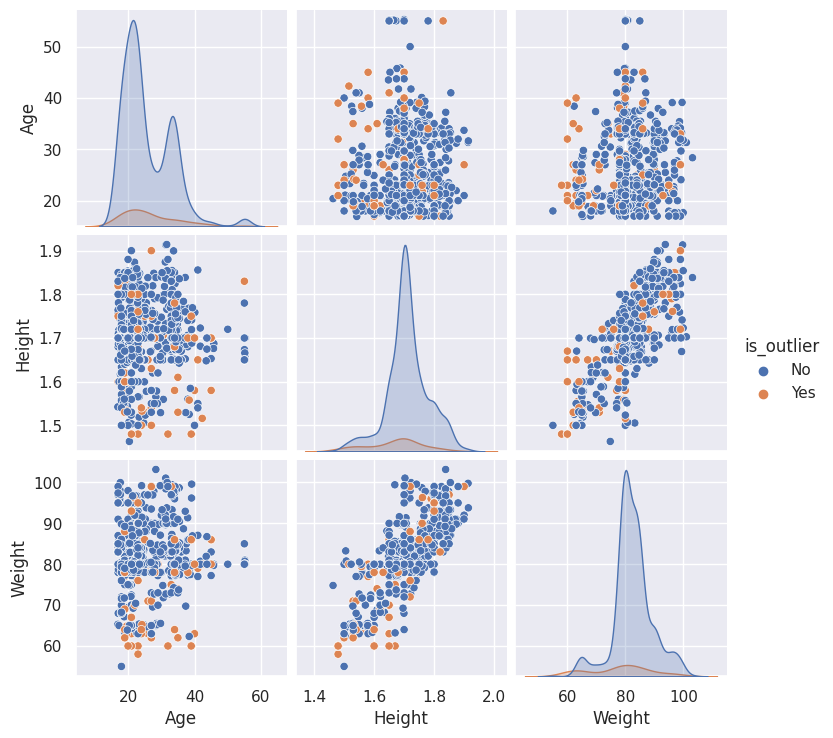

<Figure size 480x480 with 0 Axes>

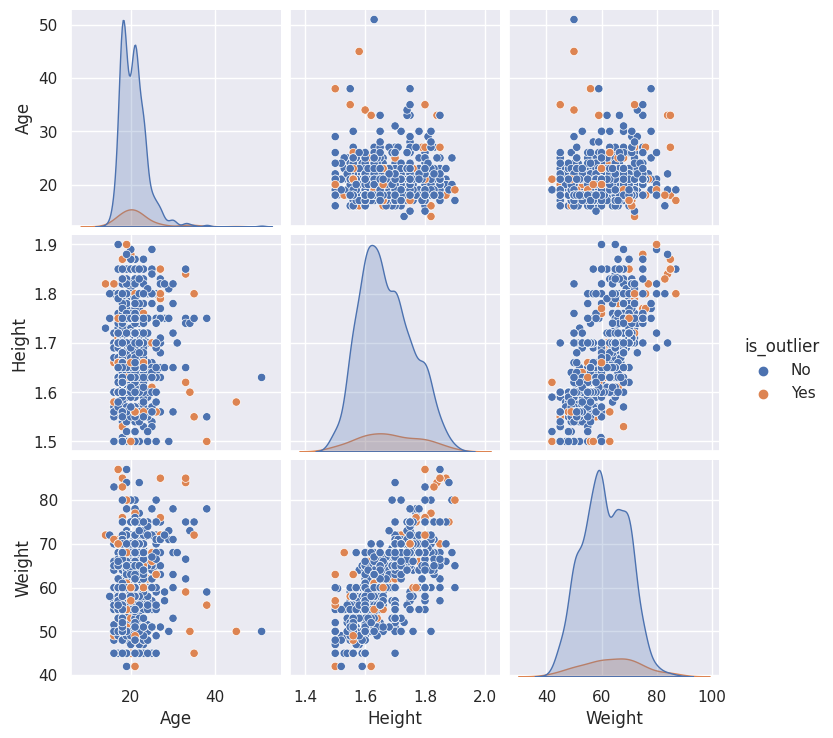

<Figure size 480x480 with 0 Axes>

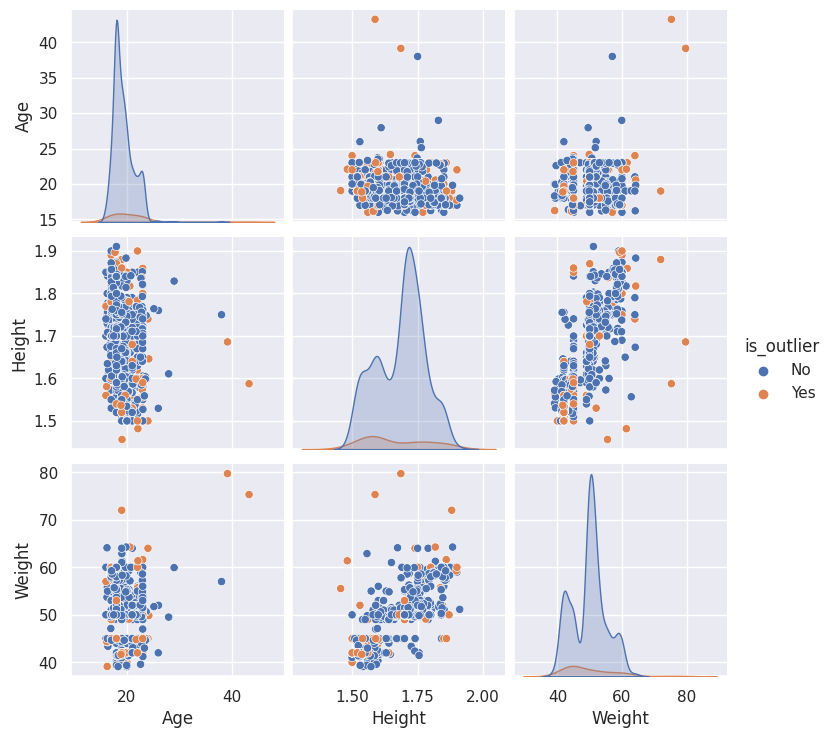

<Figure size 480x480 with 0 Axes>

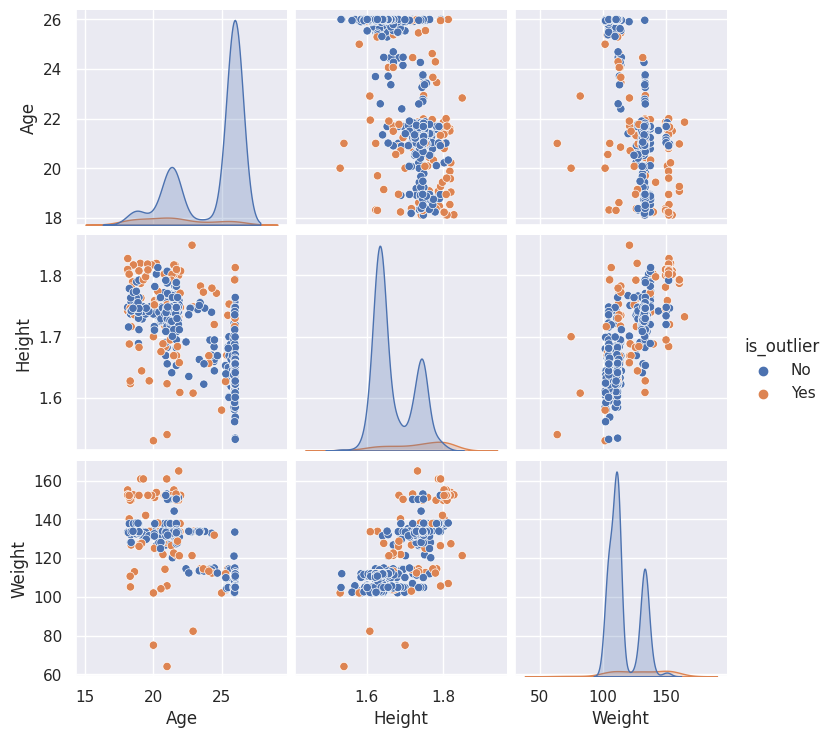

<Figure size 480x480 with 0 Axes>

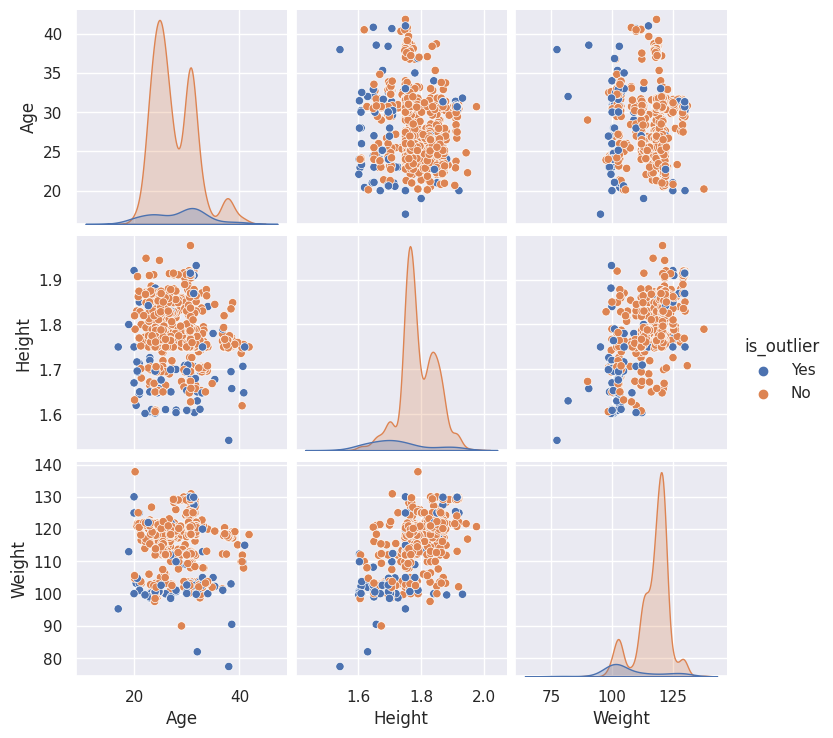

<Figure size 480x480 with 0 Axes>

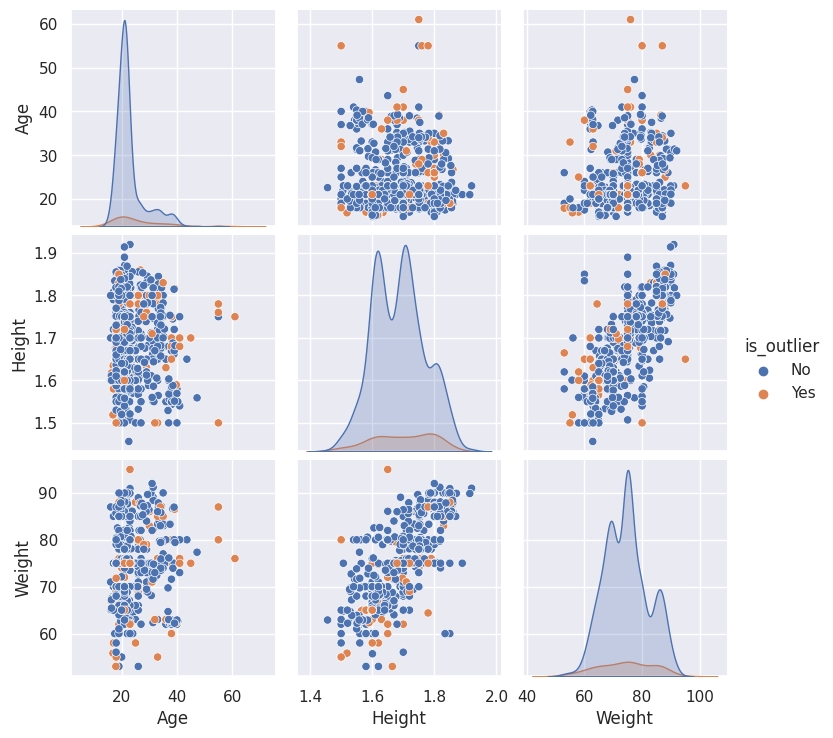

<Figure size 480x480 with 0 Axes>

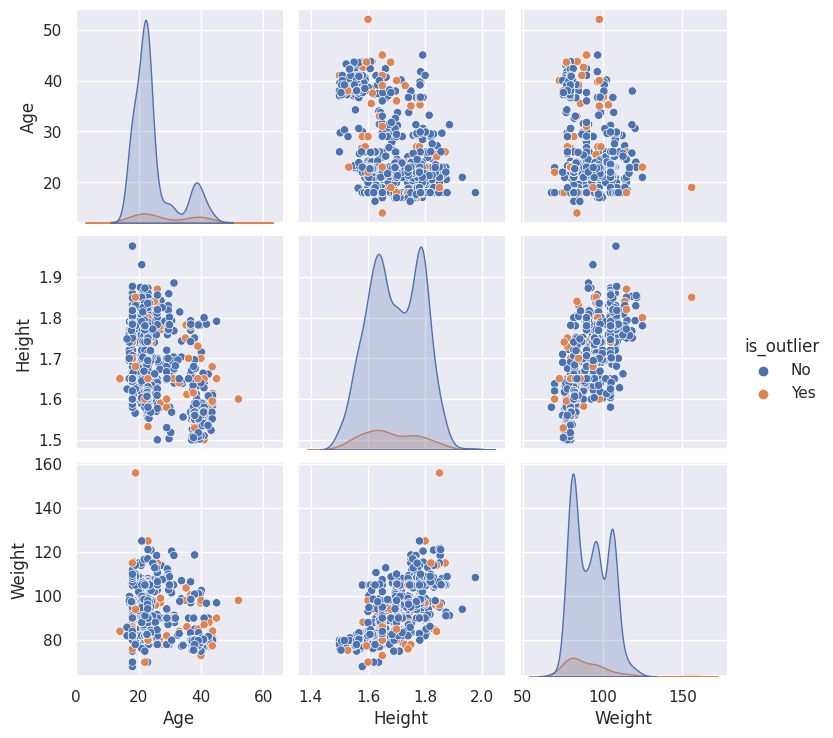

In [530]:
from sklearn.ensemble import IsolationForest
outlier_threshold = 0.1  # Adjust as needed
outliers = []
for c in list(train_data['NObeyesdad'].drop_duplicates()):
    dat = train_data[train_data['NObeyesdad'] == c][start_cols]
    isolation_forest = IsolationForest(contamination=outlier_threshold)
    dat['outlier'] = isolation_forest.fit_predict(dat)
    outliers.extend(dat[dat['outlier'] == -1].index)
    
    plt.figure(figsize=(6,6), dpi= 80)
    cols_2 = ['Age', 'Height', 'Weight']
    
    dat['is_outlier'] = np.where(dat.index.isin(outliers), 'Yes', 'No')
    
    sns.pairplot(dat[cols_2 + ['is_outlier']].sample(1000), kind="scatter", hue='is_outlier')
    plt.show()


In [531]:
train_data['is_outlier'] = np.where(train_data.index.isin(outliers), 'Yes', 'No')

<Figure size 800x640 with 0 Axes>

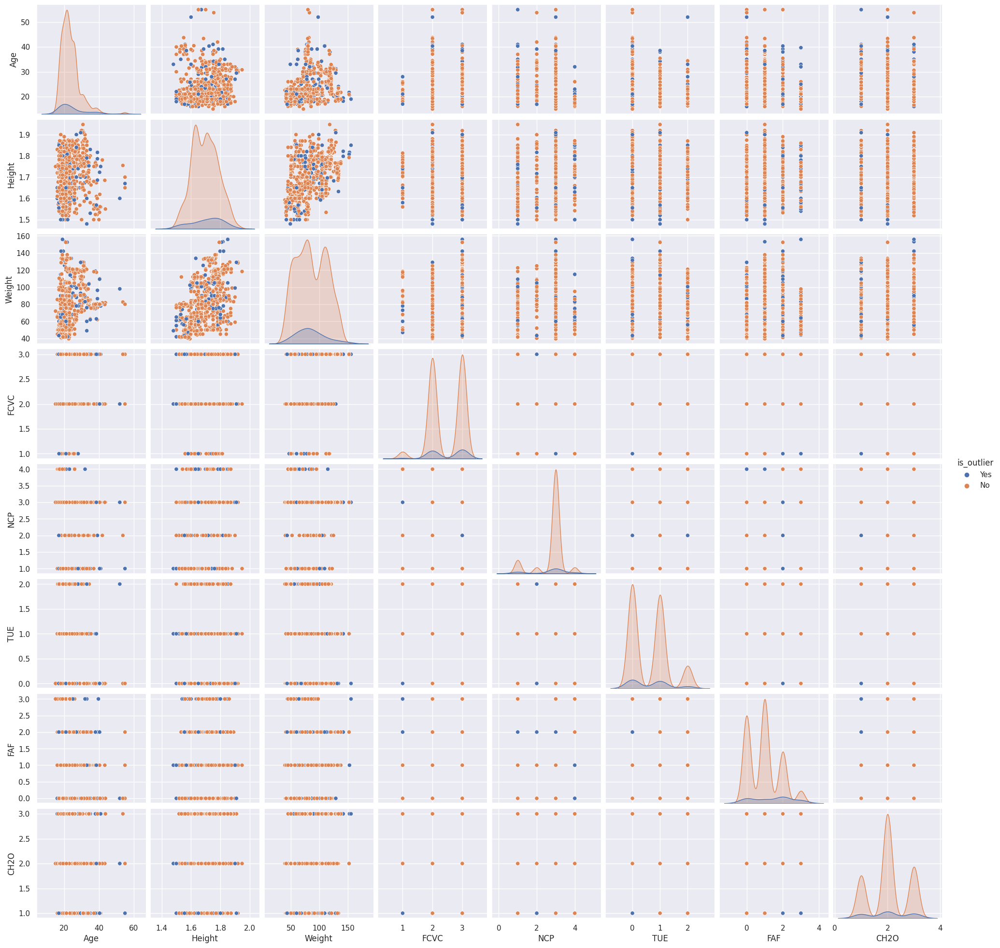

In [532]:
plt.figure(figsize=(10,8), dpi= 80)
sns.pairplot(train_data[num_columns + ['is_outlier']].sample(1000), kind="scatter", hue='is_outlier')
plt.show()

In [533]:
train_data = train_data[train_data['is_outlier']=='No']
train_data.drop(columns = ['is_outlier'], inplace = True)

In [534]:
train_data.shape

(18679, 33)

we removed about 10% of objects for each class, presumably an outliers

# Modeling

### Below i tried to use custom ordinalgbt model(*), but I didn't get any quality improvement

(*) gbt model using ordinal loss:

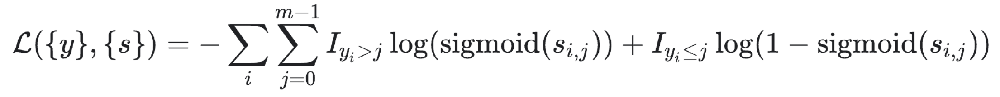

In [535]:
from ordinalgbt.lgb import LGBMOrdinal

def fit_evaluate_ordinalgbt(df_, columns = [], drop_columns = []):
    
    df = df_.copy()
    
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        columns += ['NObeyesdad']
        
    df = df[columns]
#     print(df.head())
#     print(df.drop(columns = ['NObeyesdad']))
#     print(df['NObeyesdad'])

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']

#     params = {'learning_rate': 0.13762007048684638,
#             'depth': 5, 
#           'l2_leaf_reg': 5.285199432056192,
#         'bagging_temperature': 0.6029582154263095,
#          'random_seed': RANDOM_SEED,
#         'verbose': False,
#         'task_type':"GPU",
#          'iterations':3000,
#         'verbose': 1000}
    params = {
        'iterations':2000,
        'verbose': 1000
    }



    model = LGBMOrdinal(**params)

    metrics_lst = cross_val_score(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5, scoring='accuracy')
    
    predict = cross_val_predict(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5)
    
    
    model.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
    return metrics_lst, model, predict, df['NObeyesdad']
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data[train_data['Gender'] == 0], columns = [], drop_columns = ['Gender'])
metrics_lst, ord_model, y_predict, y_target  = fit_evaluate_ordinalgbt(df_ = train_data[train_data['NObeyesdad'] <= 3], columns = [], drop_columns = [])

In [536]:
# print(metrics_lst)

# metrics_lst.mean()

### Catboost

In [537]:
!pip install --upgrade catboost
from catboost import CatBoostClassifier


In [538]:
train_data.drop(columns = ['is_NObeyesdad'], inplace = True)

In [539]:
def fit_evaluate_catboost(df_, columns = [], drop_columns = [], use_custom_loss = False):
    
    df = df_.copy()
    
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        columns += ['NObeyesdad']
        
    df = df[columns]

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']

#### params from optune 
#     params = {'learning_rate': 0.13762007048684638,
#             'depth': 5, 
#           'l2_leaf_reg': 5.285199432056192,
#         'bagging_temperature': 0.6029582154263095,
#          'random_seed': RANDOM_SEED,
#         'verbose': False,
#         'task_type':"GPU",
#          'iterations':3000,
#         'verbose': 1000}
    params = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
        'loss_function': 'MultiClass'
    }

    if use_custom_loss:
        class MultiClassObjective(object):
            def __init__(self):
                super().__init__()

            def softmax(self, scores):
                # Improve numerical stability
                exps = np.exp(scores - np.max(scores))
                return exps / np.sum(exps, axis=0)

            def ordinal_loss(self, y, scores):
                K = len(scores)
                softmax_scores = self.softmax(scores)
                loss = 0.0

                for k in range(K):
                    indicator = 1 if y >= k else 0
                    # Adjust for cases where softmax_scores[k] could be very small, leading to log(0) issue.
                    loss += np.log(max(softmax_scores[k], 1e-15)) * indicator

                return -loss

            def ordinal_loss_gradient(self, y, scores):
                K = len(scores)
                softmax_scores = self.softmax(scores)
                first_derivative = np.zeros(K)

                for k in range(K-1):
                    indicator_y_geq_k = 1 if y >= k else 0


                    first_derivative[k] = indicator_y_geq_k - softmax_scores[k] * indicator_y_geq_k

                return first_derivative

            def ordinal_loss_hessian(self, y, scores):
                K = len(scores)
                softmax_scores = self.softmax(scores)
                hessian = np.zeros((K, K))

                for i in range(K):
                    for j in range(K):
                        if i == j:
                            hessian[i, j] = softmax_scores[i] * (1 - softmax_scores[i])
                        else:
                            hessian[i, j] = -softmax_scores[i] * softmax_scores[j]

                return -hessian

            def calc_ders_multi(self, approxes, targets, weights):

                der1 = self.ordinal_loss_gradient(targets, approxes)
                der2 = self.ordinal_loss_hessian(targets, approxes)

                if weights is not None:
                        der1 *= weights
                        der2 *= np.zeros_like(weights)

                return der1, None


        
# Create a CatBoost model with the custom loss
    else:


        model = CatBoostClassifier(**params)

    metrics_lst = cross_val_score(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5, scoring='accuracy')
    
    print('metrics', metrics_lst)
    
    predict = cross_val_predict(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=2)
    
    
    model.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
    return metrics_lst, model, predict, df['NObeyesdad']
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data[train_data['Gender'] == 0], columns = [], drop_columns = ['Gender'])
# metrics_lst, cat_model, y_predict, y_target  = fit_evaluate_catboost(df_ = train_data, columns = list(selected_columns), drop_columns = [])
metrics_lst, cat_model, y_predict, y_target  = fit_evaluate_catboost(df_ = train_data, columns = start_cols + cols_, drop_columns = [])
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data, columns = [], drop_columns = [])

Learning rate set to 0.063257
0:	learn: 1.6839303	total: 7.94ms	remaining: 15.9s
1000:	learn: 0.1483504	total: 5.19s	remaining: 5.18s
1999:	learn: 0.1033191	total: 10.6s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6836225	total: 6.26ms	remaining: 12.5s
1000:	learn: 0.1448131	total: 5.3s	remaining: 5.29s
1999:	learn: 0.0995733	total: 10.7s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6850435	total: 7.07ms	remaining: 14.1s
1000:	learn: 0.1475892	total: 5.45s	remaining: 5.44s
1999:	learn: 0.1025640	total: 10.7s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6858421	total: 6.14ms	remaining: 12.3s
1000:	learn: 0.1488576	total: 5.18s	remaining: 5.17s
1999:	learn: 0.1029167	total: 10.5s	remaining: 0us
Learning rate set to 0.063258
0:	learn: 1.6842739	total: 6.49ms	remaining: 13s
1000:	learn: 0.1438793	total: 5.24s	remaining: 5.23s
1999:	learn: 0.0986781	total: 10.4s	remaining: 0us
metrics [0.91514989 0.90926124 0.91889722 0.91889722 0.91271754]
Learning rate

In [540]:
train_data.shape, test_data.shape

((18679, 32), (13840, 31))

In [541]:

cols_ = ['index_breightman', 'BMI_Grp', 'TechUse']

In [543]:
print(metrics_lst)

metrics_lst.mean()

[0.91514989 0.90926124 0.91889722 0.91889722 0.91271754]


0.9149846208531486

In [426]:
print(metrics_lst)

metrics_lst.mean()

[0.89908478 0.89980732 0.90703276 0.90291496 0.90387858]


0.9025436798431465

gender

grouped by gender: female: (0.91+)

male: 0.88

binary obesity

Classes 4 5 6 the model classifies well Obesity types (0.975)

Classes 2 3 (Overweight_Level_I, Overweight_Level_II) - binary classification, low accuracy - (0.88)

Classes 0 1 (normal and underweight) are good classified (0.94)

In [405]:
start_cols + ['index_breightman'] Weight, Height

['Gender',
 'Age',
 'Height',
 'Weight',
 'family_history_with_overweight',
 'FAVC',
 'FCVC',
 'NCP',
 'CAEC',
 'SMOKE',
 'CH2O',
 'SCC',
 'FAF',
 'TUE',
 'CALC',
 'MTRANS']

In [404]:
print(metrics_lst)

metrics_lst.mean()

[0.90197495 0.89643545 0.9072736  0.90387858 0.9046013 ]


0.9028327784144684

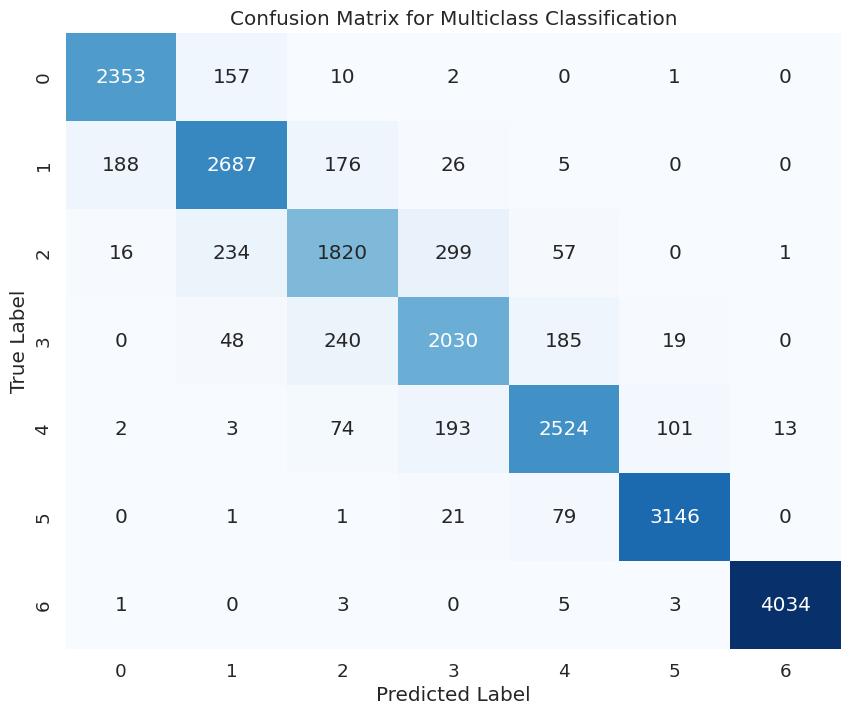

In [68]:
def plot_conf_matrix(y, predicted_labels):

    conf_matrix = confusion_matrix(y, predicted_labels)

    # Create a seaborn heatmap
    sns.set(font_scale=1.2)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix for Multiclass Classification')
    plt.show()
plot_conf_matrix(y_target, y_predict)

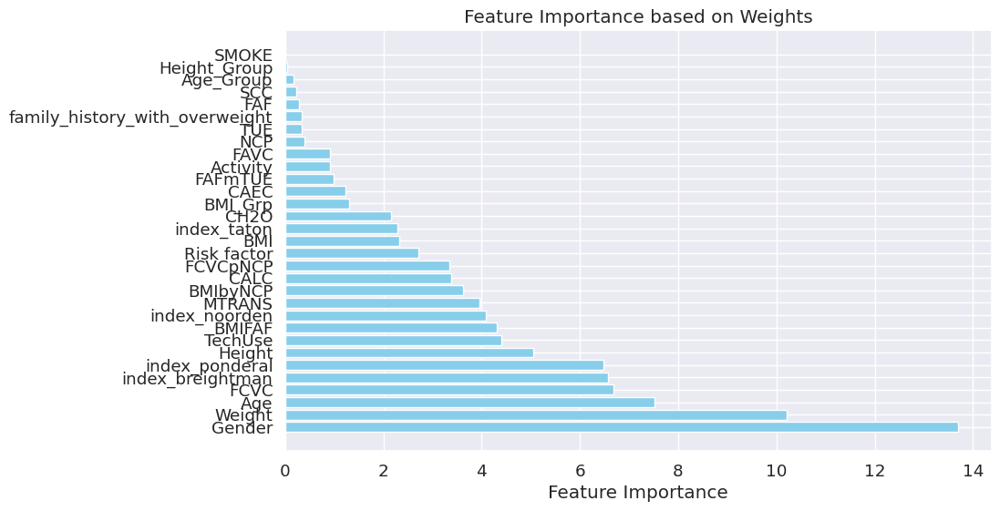

[('Gender', 13.69306629392321),
 ('Weight', 10.217827058398997),
 ('Age', 7.512129931157619),
 ('FCVC', 6.690855832262092),
 ('index_breightman', 6.573627562640776),
 ('index_ponderal', 6.471970676370541),
 ('Height', 5.056993947365344),
 ('TechUse', 4.400056401358987),
 ('BMIFAF', 4.311552786539785),
 ('index_noorden', 4.083061437320278),
 ('MTRANS', 3.960894831099793),
 ('BMIbyNCP', 3.630388881221548),
 ('CALC', 3.374676959697431),
 ('FCVCpNCP', 3.347531048841027),
 ('Risk factor', 2.7158851307449825),
 ('BMI', 2.32220311262842),
 ('index_taton', 2.283488414885271),
 ('CH2O', 2.15492891501785),
 ('BMI_Grp', 1.2991351131542852),
 ('CAEC', 1.2380012730755587),
 ('FAFmTUE', 0.9870325494167835),
 ('Activity', 0.9227033673538232),
 ('FAVC', 0.9203733628640901),
 ('NCP', 0.39028525497071376),
 ('TUE', 0.34601622912401747),
 ('family_history_with_overweight', 0.345986109505225),
 ('FAF', 0.2848270988047748),
 ('SCC', 0.23700019344272075),
 ('Age_Group', 0.17717007668720922),
 ('Height_Group

In [69]:
plot_importance(cat_model, cat_model.feature_names_)

# Catboost random search

Goal: to find best params for single model using random search

In [431]:
np.arange(2000, 5000, 500)

array([2000, 2500, 3000, 3500, 4000, 4500])

In [433]:
from sklearn.model_selection import RandomizedSearchCV
from catboost import CatBoostClassifier
from sklearn.metrics import make_scorer, accuracy_score
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np

X_train, X_test, y_train, y_test = train_test_split(train_data.drop(columns = ['NObeyesdad']),
                    train_data['NObeyesdad'], test_size=0.1, random_state=42)

# Define the CatBoost model
catboost_model = CatBoostClassifier()

# Define the parameter distribution for the random search
param_dist = {
    'iterations': np.arange(2000, 5000, 500),
    'learning_rate': np.linspace(0.05, 0.2, 20),
    'depth': np.arange(6, 20, 1),
    'loss_function': ['MultiClass', 'MultiClassOneVsAll'],
    'eval_metric': ['Accuracy'],
    'use_best_model': [True],
#     'od_type': ['Iter'],
#     'od_wait': np.arange(10, 30, 5),
    'verbose': [500],
    'task_type':["GPU"],
    
#     'feature_border_type': ['MinEntropy', 'MaxLogSum', 'GreedyLogSum', 'Uniform'],
#     'border_count': np.arange(5, 255, 20),
#     'bagging_temperature': np.linspace(0, 1, 10),
    
}

# Define the scoring metric
scoring = {'Accuracy': make_scorer(accuracy_score)}

# Perform random search
random_search = RandomizedSearchCV(estimator=catboost_model, param_distributions=param_dist, scoring='accuracy', cv=3, n_iter=10, random_state=42)
random_result = random_search.fit(X_train, y_train, eval_set=(X_test, y_test))

# Print the best parameters and corresponding accuracy
print("Best Parameters: ", random_result.best_params_)
print("Best Accuracy: ", random_result.best_score_)

0:	learn: 0.8521760	test: 0.8545279	best: 0.8545279 (0)	total: 19.1ms	remaining: 1m 6s
500:	learn: 0.9850650	test: 0.8954721	best: 0.8998073 (164)	total: 9.53s	remaining: 57.1s
1000:	learn: 0.9971897	test: 0.8925819	best: 0.8998073 (164)	total: 19s	remaining: 47.4s
1500:	learn: 0.9991167	test: 0.8925819	best: 0.8998073 (164)	total: 28.6s	remaining: 38s
2000:	learn: 0.9998394	test: 0.8921002	best: 0.8998073 (164)	total: 38s	remaining: 28.4s
2500:	learn: 0.9999197	test: 0.8925819	best: 0.8998073 (164)	total: 47.4s	remaining: 18.9s
3000:	learn: 1.0000000	test: 0.8916185	best: 0.8998073 (164)	total: 57.1s	remaining: 9.5s
3499:	learn: 1.0000000	test: 0.8911368	best: 0.8998073 (164)	total: 1m 6s	remaining: 0us
bestTest = 0.8998073218
bestIteration = 164
Shrink model to first 165 iterations.
0:	learn: 0.8513047	test: 0.8453757	best: 0.8453757 (0)	total: 17.5ms	remaining: 1m 1s
500:	learn: 0.9859494	test: 0.8930636	best: 0.8949904 (352)	total: 9.51s	remaining: 56.9s
1000:	learn: 0.9973505	test

KeyboardInterrupt: 

I decided to stop the search because I did not see any improvement in the metrics in the logs

## LGBM

In [77]:
pip install lightgbm --install-option=--gpu


Usage:   
  /opt/conda/bin/python3.10 -m pip install [options] <requirement specifier> [package-index-options] ...
  /opt/conda/bin/python3.10 -m pip install [options] -r <requirements file> [package-index-options] ...
  /opt/conda/bin/python3.10 -m pip install [options] [-e] <vcs project url> ...
  /opt/conda/bin/python3.10 -m pip install [options] [-e] <local project path> ...
  /opt/conda/bin/python3.10 -m pip install [options] <archive url/path> ...

no such option: --install-option
Note: you may need to restart the kernel to use updated packages.


In [83]:
from lightgbm import LGBMClassifier

def fit_evaluate_lightgbm(df_, columns = [], drop_columns = []):
    
    df = df_.copy()
    
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        columns += ['NObeyesdad']
        
    df = df[columns]
#     print(df.head())
#     print(df.drop(columns = ['NObeyesdad']))
#     print(df['NObeyesdad'])

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']

#     params = {'learning_rate': 0.13762007048684638,
#             'depth': 5, 
#           'l2_leaf_reg': 5.285199432056192,
#         'bagging_temperature': 0.6029582154263095,
#          'random_seed': RANDOM_SEED,
#         'verbose': False,
#         'task_type':"GPU",
#          'iterations':3000,
#         'verbose': 1000}
    params = {
         'num_class':7, 
         'metric': 'multi_logloss',
         'verbose': 0,
        'device':"gpu",
        'objective': 'multiclass'
    }




    model = LGBMClassifier(**params)
#     print(df['NObeyesdad'])

    metrics_lst = cross_val_score(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5, scoring='accuracy')
    
    print('metrics', metrics_lst)
    
    predict = cross_val_predict(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=2)
    
    
    model.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
    return metrics_lst, model, predict, df['NObeyesdad']
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data[train_data['Gender'] == 0], columns = [], drop_columns = ['Gender'])
metrics_lst, lgb_model, y_predict, y_target  = fit_evaluate_lightgbm(df_ = train_data, columns = [], drop_columns = [])
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data, columns = [], drop_columns = [])

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
metrics [0.89812139 0.89932563 0.90895954 0.89881956 0.90267405]
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


In [84]:
print(metrics_lst)

metrics_lst.mean()

[0.89812139 0.89932563 0.90895954 0.89881956 0.90267405]


0.9015800334111752

### xgboost

In [88]:
from xgboost import XGBClassifier
def fit_evaluate_xgboost(df_, columns = [], drop_columns = []):
    
    df = df_.copy()
    
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        columns += ['NObeyesdad']
        
    df = df[columns]
#     print(df.head())
#     print(df.drop(columns = ['NObeyesdad']))
#     print(df['NObeyesdad'])

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']

    params = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
    }



    model = XGBClassifier(**params)

    metrics_lst = cross_val_score(model, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5, scoring='accuracy')
    
    model.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
    return metrics_lst, model, 
# metrics_lst, xgb_model  = fit_evaluate_xgboost(df_ = train_data[train_data['Gender'] == 1], columns = [], drop_columns = ['Gender'])
metrics_lst, xgb_model  = fit_evaluate_xgboost(df_ = train_data, columns = [], drop_columns = [])

In [89]:
# len(train_data[train_data['Gender'] == 0])/len(train_data)

In [90]:
print(metrics_lst)

metrics_lst.mean()

[0.89932563 0.89836224 0.90245665 0.89592869 0.90363768]


0.8999421756440054

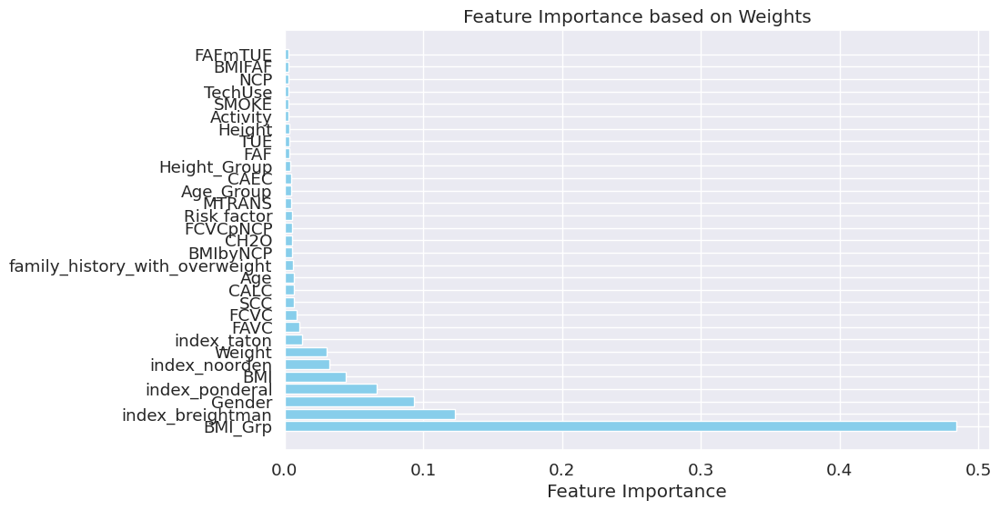

[('BMI_Grp', 0.48397294),
 ('index_breightman', 0.122875206),
 ('Gender', 0.093590744),
 ('index_ponderal', 0.066704795),
 ('BMI', 0.04430111),
 ('index_noorden', 0.03212317),
 ('Weight', 0.030502617),
 ('index_taton', 0.012858038),
 ('FAVC', 0.010659785),
 ('FCVC', 0.00867749),
 ('SCC', 0.0070603024),
 ('CALC', 0.006669121),
 ('Age', 0.0064312466),
 ('family_history_with_overweight', 0.005850976),
 ('BMIbyNCP', 0.005717365),
 ('CH2O', 0.005585454),
 ('FCVCpNCP', 0.005545132),
 ('Risk factor', 0.005138556),
 ('MTRANS', 0.0050185355),
 ('Age_Group', 0.004745072),
 ('CAEC', 0.00472838),
 ('Height_Group', 0.0041231094),
 ('FAF', 0.0034288603),
 ('TUE', 0.0033924137),
 ('Height', 0.0033472043),
 ('Activity', 0.0031384174),
 ('SMOKE', 0.0030956168),
 ('TechUse', 0.0029338715),
 ('NCP', 0.002761289),
 ('BMIFAF', 0.002517086),
 ('FAFmTUE', 0.0025062389)]

In [91]:
plot_importance(xgb_model, xgb_model.get_booster().feature_names)

In [92]:
xgb_model

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, iterations=2000, learning_rate=None,
              max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

all basic models showed approximately the same accuracy using cross-validation

## Pyboost

# VoteClassifier

Final model: 

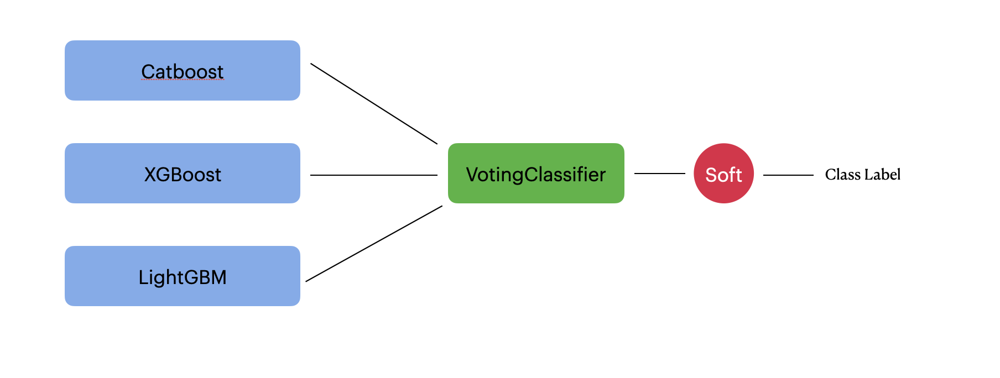

In [546]:
from sklearn.ensemble import VotingClassifier
def fit_evaluate_vote(df_, columns = [], drop_columns = []):
    
    df = df_.copy()
    
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        columns += ['NObeyesdad']
        
    df = df[columns]
#     print(df.head())
#     print(df.drop(columns = ['NObeyesdad']))
#     print(df['NObeyesdad'])

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']


    params_cat = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
        'loss_function': 'MultiClass'
    }
    
    params_lgbm = {
         'num_class':7, 
         'metric': 'multi_logloss',
         'verbose': 0,
         'device':"gpu",
         'objective': 'multiclass_ova'
    }
    
    params_xgb = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
    }



    model_xgb = XGBClassifier(**params_xgb)

    model_lgbm = LGBMClassifier(**params_lgbm)
    
    model_cat = CatBoostClassifier(**params_cat)

    voting_classifier = VotingClassifier(
        
        estimators=[
            ('model_cat', model_cat),
            ('model_lgbm', model_lgbm),
            ('model_xgb', model_xgb)
        ],
        voting='soft'  # 'hard' for majority voting, 'soft' for weighted voting based on probabilities
    )
    
#     print(df['NObeyesdad'])

    metrics_lst = cross_val_score(voting_classifier, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=5, scoring='accuracy')
    
    print('metrics', metrics_lst)
    
    predict = cross_val_predict(voting_classifier, df.drop(columns = drop_columns + ['NObeyesdad']),
                    df['NObeyesdad'], cv=2)
    
    
    voting_classifier.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
    return metrics_lst, voting_classifier, predict, df['NObeyesdad']
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data[train_data['Gender'] == 0], columns = [], drop_columns = ['Gender'])
metrics_lst, cat_model, y_predict, y_target  = fit_evaluate_vote(df_ = train_data, columns = start_cols + cols_, drop_columns = [])
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data, columns = [], drop_columns = [])

Learning rate set to 0.063257
0:	learn: 1.6839301	total: 8.77ms	remaining: 17.5s
1000:	learn: 0.1483504	total: 5.79s	remaining: 5.78s
1999:	learn: 0.1033191	total: 11.3s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6836225	total: 6.29ms	remaining: 12.6s
1000:	learn: 0.1448131	total: 5.58s	remaining: 5.57s
1999:	learn: 0.0995733	total: 11s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6850435	total: 6.82ms	remaining: 13.6s
1000:	learn: 0.1475892	total: 5.35s	remaining: 5.34s
1999:	learn: 0.1025640	total: 10.8s	remaining: 0us
Learning rate set to 0.063257
0:	learn: 1.6858419	total: 7.59ms	remaining: 15.2s
1000:	learn: 0.1488577	total: 5.42s	remaining: 5.41s
1999:	learn: 0.1029167	total: 11s	remaining: 0us
Learning rate set to 0.063258
0:	learn: 1.6842739	total: 6.67ms	remaining: 13.3s
1000:	learn: 0.1438793	total: 5.32s	remaining: 5.31s
1999:	learn: 0.0986781	total: 10.6s	remaining: 0us
metrics [0.91622056 0.91220557 0.92291221 0.91729122 0.91726908]
Learning rate 

In [547]:
print(metrics_lst)

metrics_lst.mean()

[0.91622056 0.91220557 0.92291221 0.91729122 0.91726908]


0.917179725325284

In [545]:
print(metrics_lst)

metrics_lst.mean()

[0.91220557 0.9111349  0.92184154 0.91595289 0.91753681]


0.9157343435125226

# Submit 

In [400]:
test_data_tosub = pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')
start_cols = list(test_data_tosub.drop(columns = ['id']).columns)
start_cols

['Gender',
 'Age',
 'Height',
 'Weight',
 'family_history_with_overweight',
 'FAVC',
 'FCVC',
 'NCP',
 'CAEC',
 'SMOKE',
 'CH2O',
 'SCC',
 'FAF',
 'TUE',
 'CALC',
 'MTRANS']

In [562]:
from sklearn.ensemble import VotingClassifier
def submit_func(df_, df_test, columns = [], drop_columns = []):
    
    df = df_.copy()
    columns_test = df.drop(columns = ['NObeyesdad']).copy()
    if len(columns) == 0:
        columns = df.columns
    
    else:
        columns = list(columns)
        
        columns += ['NObeyesdad']
        
    df = df[columns]
#     print(df.head())
#     print(df.drop(columns = ['NObeyesdad']))
#     print(df['NObeyesdad'])

    cat_features = ['Gender','family_history_with_overweight','FAVC','FCVC','NCP',
                'CAEC','SMOKE','CH2O','SCC','FAF','TUE','CALC','MTRANS']


    params_cat = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
        'loss_function': 'MultiClass'
    }
    
    params_lgbm = {
         'num_class':7, 
         'metric': 'multi_logloss',
         'verbose': 0,
         'device':"gpu",
         'objective': 'multiclass_ova'
    }
    
    params_xgb = {
        'iterations':2000,
        'verbose': 1000,
        'task_type':"GPU",
    }



    model_xgb = XGBClassifier(**params_xgb)

    model_lgbm = LGBMClassifier(**params_lgbm)
    
    model_cat = CatBoostClassifier(**params_cat)

    voting_classifier = VotingClassifier(
        
        estimators=[
            ('model_cat', model_cat),
            ('model_lgbm', model_lgbm),
            ('model_xgb', model_xgb)
        ],
        voting='soft'  # 'hard' for majority voting, 'soft' for weighted voting based on probabilities
    )
    
#     print(df['NObeyesdad'])

#     metrics_lst = cross_val_score(voting_classifier, df.drop(columns = drop_columns + ['NObeyesdad']),
#                     df['NObeyesdad'], cv=5, scoring='accuracy')
    
#     print('metrics', metrics_lst)

    voting_classifier.fit(df.drop(columns = drop_columns + ['NObeyesdad']), df['NObeyesdad'])
    
#     if len(columns) > 0:
    
#         predict = voting_classifier.predict(df_test[columns_test].drop(columns = drop_columns))
#     else:
    predict = voting_classifier.predict(df_test.drop(columns = drop_columns))
    
    
    return predict
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data[train_data['Gender'] == 0], columns = [], drop_columns = ['Gender'])
predict = submit_func(df_ = train_data, df_test = test_data, columns = [], drop_columns = [])
# metrics_lst, cat_model  = fit_evaluate_catboost(df_ = train_data, columns = [], drop_columns = [])

Learning rate set to 0.066204
0:	learn: 1.6851131	total: 6.4ms	remaining: 12.8s
1000:	learn: 0.1533351	total: 5.58s	remaining: 5.57s
1999:	learn: 0.1088614	total: 11.1s	remaining: 0us
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines


In [563]:
cols_

['index_breightman', 'BMI_Grp', 'TechUse']

In [564]:
predict

array([5, 2, 6, ..., 0, 1, 5], dtype=uint8)

In [566]:
test_data_tosub = pd.read_csv('/kaggle/input/playground-series-s4e2/test.csv')
map_dict = {'Insufficient_Weight':0, 'Normal_Weight': 1, 'Overweight_Level_I':2, 'Overweight_Level_II':3,
                                             'Obesity_Type_I':4, 'Obesity_Type_II':5, 'Obesity_Type_III': 6}

test_data_tosub['NObeyesdad'] = predict
test_data_tosub = test_data_tosub[['id', 'NObeyesdad']]
test_data_tosub['NObeyesdad'] = test_data_tosub['NObeyesdad'].map({map_dict[i]:i for i in map_dict})
test_data_tosub = test_data_tosub.set_index('id')
test_data_tosub

,NObeyesdad
id,
20758,Obesity_Type_II
20759,Overweight_Level_I
20760,Obesity_Type_III
20761,Obesity_Type_I
20762,Obesity_Type_III
...,...
34593,Overweight_Level_II
34594,Normal_Weight
34595,Insufficient_Weight


In [567]:
test_data_tosub.to_csv('vote_lgb_xgb_cat_outliers_2.csv')

### Below I tried to use the automl framework, but ran into problems with package versions

### automl

In [66]:
!python -m pip install --upgrade pip
!python -m pip install autogluon

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 42.6 MB/s eta 0:00:0000:01
  Attempting uninstall: pip
    Found existing installation: pip 23.3.2
    Uninstalling pip-23.3.2:
      Successfully uninstalled pip-23.3.2


In [69]:
!pip install --upgrade scikit-learn
import sklearn

In [2]:
!pip install autogluon -U  # Only install autogluon.tabular module and all its dependencies
from autogluon.tabular import TabularPrediction as task

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.2/41.2 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.4/90.4 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 2.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.9/116.9 kB 8.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 85.2 MB/s eta 0:00:00:00:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.2/13.2 MB 8.4 MB/s eta 0:00:0000:0100:01m
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.3/79.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.2/112.2 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 410.5/410.5 kB 23.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 66.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━

ImportError: cannot import name 'TabularPrediction' from 'autogluon.tabular' (/opt/conda/lib/python3.10/site-packages/autogluon/tabular/__init__.py)

In [72]:
# from autogluon.tabular import TabularDataset, TabularPredictor

!pip install -U pip setuptools wheel
!pip uninstall typing -y
!pip install -U mxnet
!pip install -U --pre autogluon.tabular[all]
!pip install -U pyarrow
!pip install -U pandas==1.1.*
!pip install -U scikit-optimize
!pip install -U catboost
!pip install -U lightgbm

import autogluon.core as ag
from autogluon.tabular import TabularPrediction as task

  Using cached setuptools-69.0.3-py3-none-any.whl.metadata (6.3 kB)
Using cached setuptools-69.0.3-py3-none-any.whl (819 kB)
  Attempting uninstall: setuptools
    Found existing installation: setuptools 60.2.0
    Uninstalling setuptools-60.2.0:
      Successfully uninstalled setuptools-60.2.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
libpysal 4.9.2 requires packaging>=22, but you have packaging 21.3 which is incompatible.
libpysal 4.9.2 requires shapely>=2.0.1, but you have shapely 1.8.5.post1 which is incompatible.
momepy 0.7.0 requires shapely>=2, but you have shapely 1.8.5.post1 which is incompatible.
openxlab 0.0.34 requires setuptools~=60.2.0, but you have setuptools 69.0.3 which is incompatible.
osmnx 1.8.1 requires shapely>=2.0, but you have shapely 1.8.5.post1 which is incompatible.
spopt 0.6.0 requires shapely>=2.0.1, but you have shapely 1.8.5

ImportError: cannot import name '_fit_context' from 'sklearn.base' (/opt/conda/lib/python3.10/site-packages/sklearn/base.py)

In [ ]:

train_data = TabularDataset(train_data)
train_data.head()

In [ ]:
label = target
train_data[label].describe()

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(train_data.drop(columns = ['is_NObeyesdad', 'NObeyesdad']), train_data['is_NObeyesdad'], test_size=0.2, shuffle=True)
train_data = TabularDataset(train_data)
predictor = TabularPredictor(label=label).fit(train_data)

# Conclusions:

The best model - Votting classifier (catboost + xgb + lgbm)
accuracy = 0.917

we tried many models: LogisticRegression, Random forest, gradient boosting, MLP classifier, but the ensemble described above gave the best metric

## successful techniques:

* removing ouliers (+2% acc cv)
* Ensemble model (votting classifier) (+1% acc cv)
* feature engineering (+1% acc cv)

## unsuccessful practices:
* Pseudo Labeling 
* Ordinal loss 
* Stacking Ensemble
* Features Selection random Forest+RFE
* Random Search for baseline models 


## Exploration Wishlist

* AutoML: autogluon framework 
* Pyboost 
* Optuna hyperparameter tuning
* Regression model
* Search for data leaks
* Binary classification (is_obesity) -> two separate classifiers